# ChIP AML PiPeline v2

In [209]:
import os
import pandas as pd
import sys
sys.path.insert(0, '../..')
import itertools
from scipy import stats
import numpy as np

from genepy.epigenetics import chipseq as chip
from genepy.utils import helper
from genepy.utils import plot
from genepy.epigenetics import plot as cplot

import igv
import SimpSOM as sps
from scipy import stats

import seaborn as sns
from matplotlib import cm
from matplotlib import pyplot as plt
from IPython.display import IFrame
import seaborn as sns
from bokeh.plotting import *
import igv

import numba
from numba import jit

from scipy.cluster.hierarchy import linkage, leaves_list
from sklearn.cluster import AgglomerativeClustering, DBSCAN, KMeans, OPTICS
from sklearn.mixture import GaussianMixture
from sklearn.manifold import MDS, TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from IPython.display import IFrame

from statsmodels.stats.multitest import multipletests

from pybedtools import BedTool
import pyBigWig

output_notebook()
%load_ext autoreload
%autoreload 2

Loading BokehJS ...

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [235]:
#setting basic parameters
project="Cobinding_ChIP"
version="v3"
merging_version="remove_single_wmotif"
window="150"

In [138]:
merged = pd.read_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/merged_with_motifs.bed.gz', sep='\t', index_col=0)

In [103]:
merged.columns

Index(['chrom', 'start', 'end', 'peak_number', 'foldchange', '-log10pvalue',
       '-log10qvalue', 'relative_summit_pos', 'FLAG_GFI1', 'CEBPA',
       ...
       'FLAG_MEF2D_wmot', 'MYC-rmIRF8', 'MED1-rmIRF8', 'MYC-rmMEF2D',
       'MEF2C-rmMEF2D', 'MEF2C-rmIRF8', 'IRF8-rmMEF2D', 'POLII_total-rmMEF2D',
       'MED1-rmMEF2D', 'POLII_total-rmIRF8'],
      dtype='object', length=142)

In [69]:
#retrieving the data from the previous notebook
%store -r merged
%store -r chrombed
%store -r mergedpeak

In [5]:
%store -r cols
%store -r annot
%store -r version
%store -r merging_version
%store -r window
%store -r crc

In [1014]:
merging_version

'remove_single'

In [139]:
merged = merged.fillna(0)

In [140]:
# get onmotif regions
rename = {}
torm= []
for v in merged.columns:
    if "_wmot" in v:
        merged[v.replace('_wmot','')] = merged[v]
        rename.update({v.replace('_wmot',''):v})
        torm.append(v.replace('_wmot','_mot'))
merged = merged.drop(columns=rename.values()).rename(columns=rename).drop(columns=torm)

In [ ]:
merged[merged.columns[cols:]] = merged[merged.columns[cols:]].astype(float)
merged = merged[merged[merged.columns[cols:]].astype(bool).sum(1)!=0]
#merged = merged[merged[merged.columns[cols:annot]].astype(bool).sum(1)>1]
merged = merged.reset_index(drop=True)

In [240]:
helper.createFoldersFor("../results/"+project+"/"+version+"_"+merging_version+"_"+window+"/plots/")

## Correlation with Annotations

### non binarized

In [238]:
#data = pd.DataFrame(np.corrcoef(stats.zscore(0.01+merged[merged.columns[cols:]].T)), columns=merged.columns[cols:], index = merged.columns[cols:])
data = pd.DataFrame(np.corrcoef(merged[merged.columns[cols:]].T.values.astype(float)), columns=merged.columns[cols:], index = merged.columns[cols:])
link = linkage(data[:annot-cols])
col = data.iloc[annot-cols:]
col = col[[co for co in col.columns if co not in col.index.tolist()]]
rdb = cm.get_cmap('RdBu_r', 256)
for val in col.columns:
    a = [rdb(128+int(v*128)) for v in col[val]]
    col[val] = a

### Correlation: hierarchical clustering

A hierarchically clustered heatmap representing the correlation coefficient of each CRC TF's signal with each other within the cobinding matrix. Above is displayed the correlation of non CRC proteins/marks with CRC TFs.

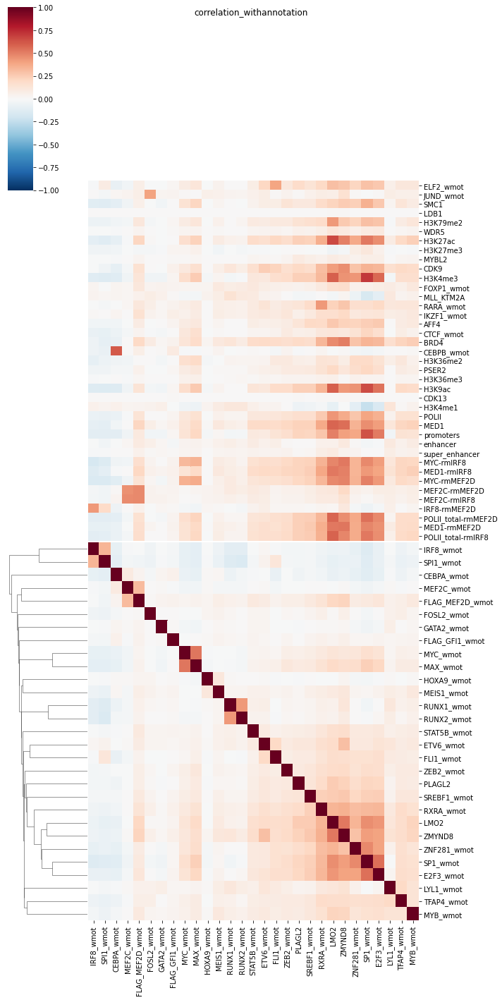

In [241]:
#correlation_withannotation
fig = sns.clustermap(data.iloc[:annot][data.columns[leaves_list(link)]], vmin=-1,vmax=1, col_colors=col.T, figsize=(10,20), cmap='RdBu_r', row_linkage=link, col_cluster=False, colors_ratio=0.01)
fig.ax_col_dendrogram.set_visible(False)
fig.fig.suptitle("correlation_withannotation")
#fig.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/correlation_with_annotation.pdf')
fig.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/boolcorrelation_with_annotation.pdf')
plt.show()

### binarized

similar plot computed on binarized signal (whether a peak is present at a location or not)

In [242]:
#data = pd.DataFrame(np.corrcoef(stats.zscore(0.01+merged[merged.columns[cols:]].T)), columns=merged.columns[cols:], index = merged.columns[cols:])
data = pd.DataFrame(np.corrcoef(merged[merged.columns[cols:]].T.astype(bool)), columns=merged.columns[cols:], index = merged.columns[cols:])
link = linkage(data[:annot-cols])
col = data.iloc[annot-cols:]
col = col[[co for co in col.columns if co not in col.index.tolist()]]
rdb = cm.get_cmap('RdBu_r', 256)
for val in col.columns:
    a = [rdb(128+int(v*128)) for v in col[val]]
    col[val] = a

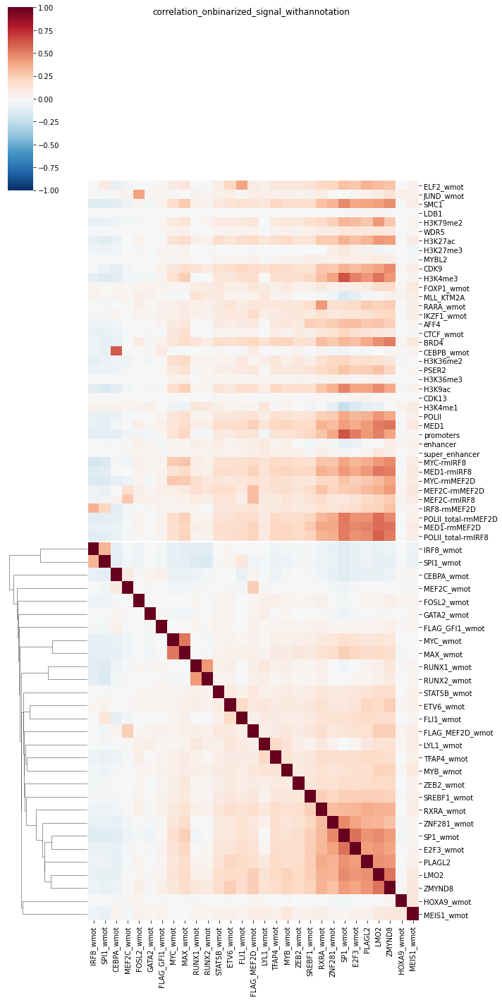

In [243]:
#correlation_withannotation
fig = sns.clustermap(data.iloc[:annot][data.columns[leaves_list(link)]], vmin=-1,vmax=1, col_colors=col.T, figsize=(10,20), cmap='RdBu_r', row_linkage=link, col_cluster=False, colors_ratio=0.01)
fig.ax_col_dendrogram.set_visible(False)
fig.fig.suptitle("correlation_onbinarized_signal_withannotation")
#fig.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/correlation_with_annotation.pdf')
fig.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/boolcorrelation_onbinarized_signal_with_annotation.pdf')

plt.show()

## Looking at peak overlap 

How many of peak in A (column) overlaps with peak in B (rows)

In [245]:
overlap, correlation = await chip.pairwiseOverlap(merged, norm=True)
enrichment, pvals = await chip.enrichment(merged)

we will be correcting for fully similar lines/ columns by removing 1 on their last value


/home/jeremie/.local/lib/python3.8/site-packages/scipy/stats/stats.py:2419: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/conda/lib/python3.8/site-packages/numpy/lib/function_base.py:2642: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/opt/conda/lib/python3.8/site-packages/numpy/lib/function_base.py:2643: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/home/jeremie/.local/lib/python3.8/site-packages/scipy/stats/stats.py:2416: RuntimeWarning: Mean of empty slice.
  mns = a.mean(axis=axis, keepdims=True)
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:180: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods

In [246]:
#saving the enrichments
overlap.to_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/pairwise_overlap.csv')
correlation.to_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/pairwise_correlation_on_overlap.csv')
enrichment.to_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/pairwise_enrichment_on_overlap.csv')
pvals.to_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/pairwise_enrichment_on_overlap_pvals.csv')

In [1011]:
merging_version = "remove_single"

In [262]:
overlap = pd.read_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/pairwise_overlap.csv', index_col=0)
correlation = pd.read_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/pairwise_correlation_on_overlap.csv', index_col=0)
enrichment = pd.read_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/pairwise_enrichment_on_overlap.csv', index_col=0)
pvals = pd.read_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/pairwise_enrichment_on_overlap_pvals.csv', index_col=0)

### pairwise overlap

Overlap of ROW proteins peaks in COLUMN protein peaks. A hierarchically clustered heatmap where 1 represent 100% overlap and 0, 0%. (e.g. E2F3 binds almost always (>80% of the time) under SREBF1. But SREBF1 only does so ~10% of the time.)
The bottom-left side square are the CRC (clustered). At the top and right side has been added additional signals of histone marks/state and non CRC proteins (non clustered). The plot is non symmetrical as a protein can bind in many more places than another and thus cover all its binding regions while binding in many other places.

In [247]:
link = linkage(overlap.iloc[:annot-cols]) # D being the measurement
c = overlap[[co for co in overlap.columns if co not in overlap.iloc[:annot-cols].index.tolist()]]
viridis = cm.get_cmap('viridis', 256)
for val in c.columns:
    a = [viridis(int(v*255)) for v in c[val]]
    c[val] = a

<ipython-input-247-19a8ad627eb5>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c[val] = a


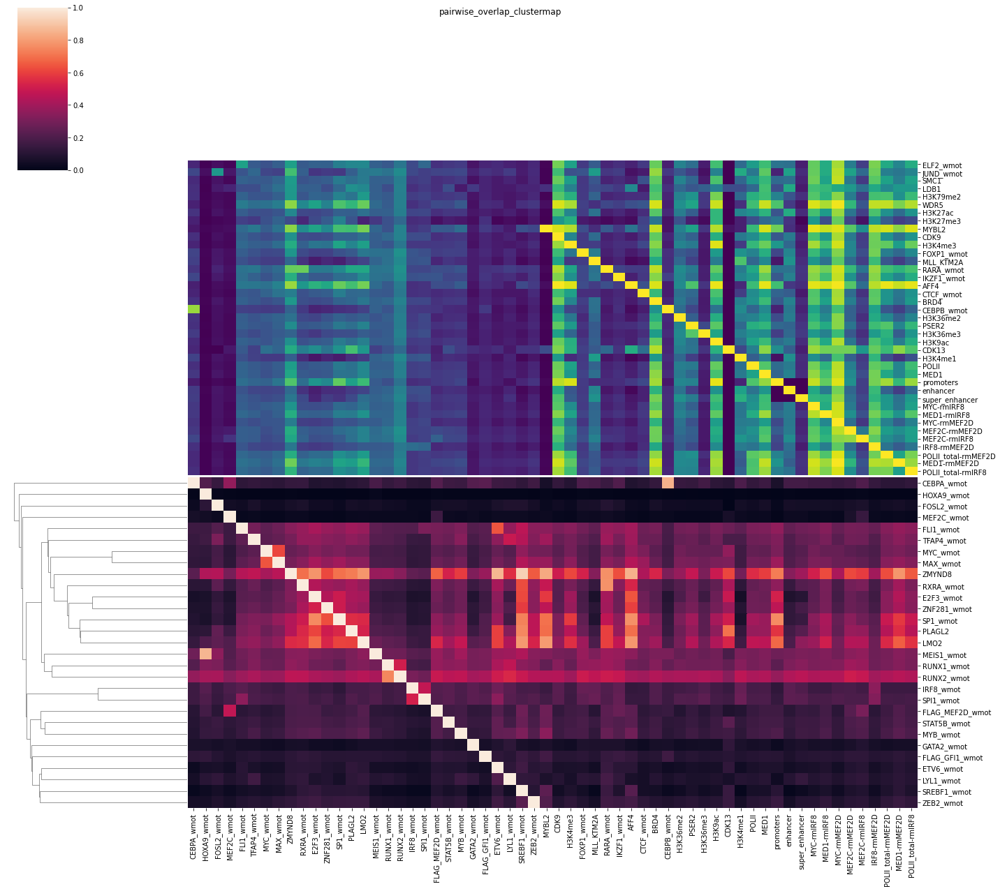

In [248]:
fig = sns.clustermap(overlap.iloc[:annot-cols][overlap.columns[np.concatenate((leaves_list(link), range(annot, len(overlap.columns))))]], row_linkage=link, col_colors=c,figsize=(20,18), colors_ratio=0.01, col_cluster=False)
fig.ax_col_dendrogram.set_visible(False)
fig.fig.suptitle("pairwise_overlap_clustermap")
fig.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/pairwise_overlap_clustermap.pdf')
plt.show()

### Correlation on overlaps 

Here we display the correlation on binding signal, only on regions where the two proteins/signals overlap. It allows us to recover signal that would be hidden for sets of TF that would only co-bind in few places.

In [249]:
link = linkage(correlation.iloc[:annot-cols], optimal_ordering=True) # D being the measurement
c = correlation[[co for co in correlation.columns if co not in correlation.iloc[:annot-cols].index.tolist()]]
viridis = cm.get_cmap('viridis', 256)
for val in c.columns:
    a = [rdb(128+int(v*128)) for v in c[val]]
    c[val] = a

<ipython-input-249-3aedbc1f266b>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c[val] = a


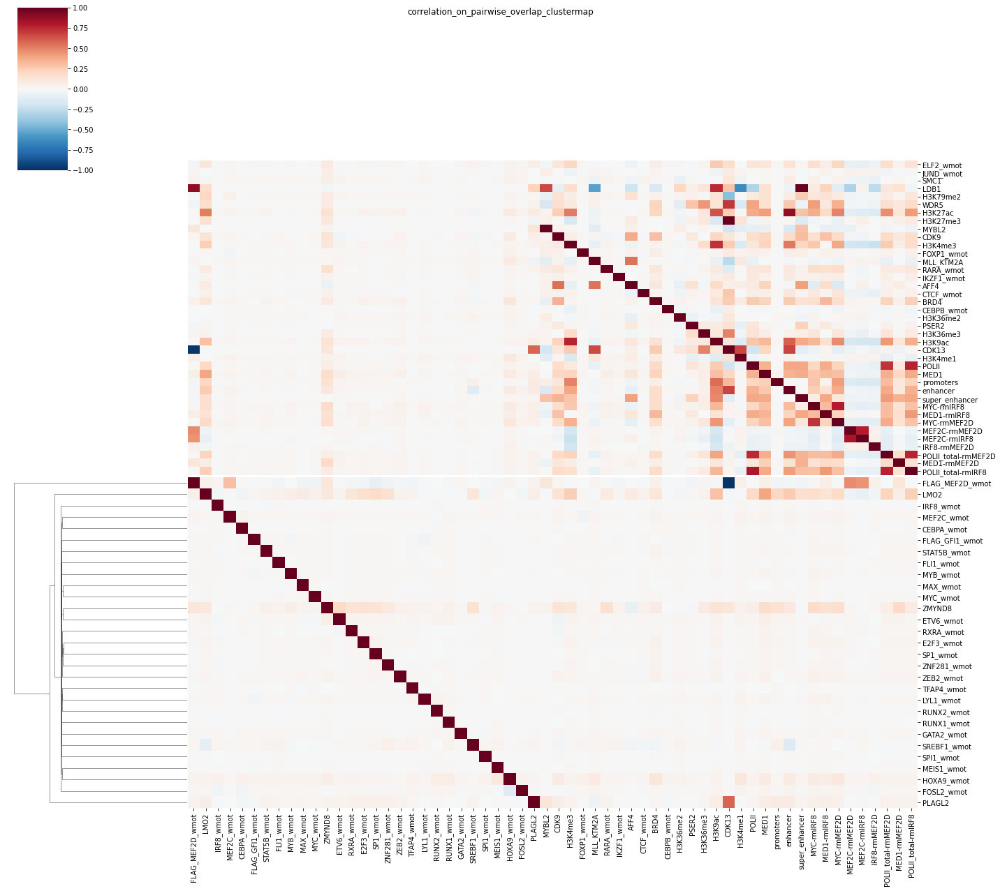

In [250]:
fig = sns.clustermap(correlation.iloc[:annot-cols][correlation.columns[np.concatenate((leaves_list(link), range(annot, len(correlation.columns))))]], row_linkage=link, col_colors=c, colors_ratio=0.01, figsize=(20,18), vmin=-1, vmax=1, cmap='RdBu_r', col_cluster=False)
fig.ax_col_dendrogram.set_visible(False)
fig.fig.suptitle("correlation_on_pairwise_overlap_clustermap")
fig.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/correlation_onoverlap.pdf')
plt.show()

### Enrichments on the cobinding matrix

Log-enrichments given for each TF and chromatin mark over each other. Enrichment is computed by doing a fisher's exact test on the expected vs observed presence of ROW protein peaks under COLUMN protein peaks. Pvalues are then corrected for multiple hypothesis testing using the BH method. (e.g. here CTCF is very strongly enriched in SMC1 but SMC1 is not as much)

In [251]:
crc = crc & set(enrichment.columns)

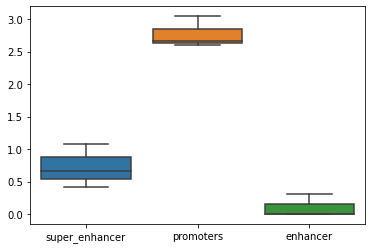

In [252]:
sns.boxplot(data=enrichment.loc[crc][["super_enhancer","promoters","enhancer"]])
plt.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/average_enrichment_ctf_in_enhancers.pdf')

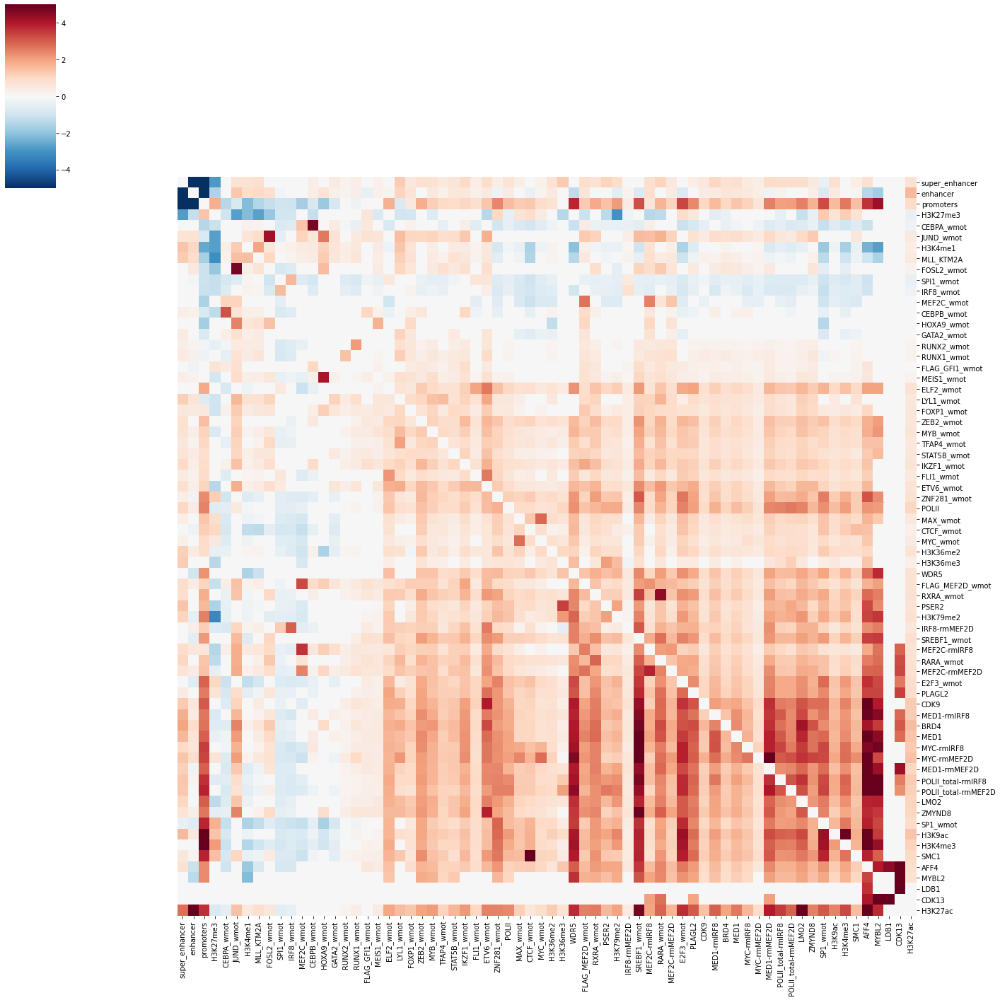

In [253]:
link = linkage(enrichment, optimal_ordering=True)
fig = sns.clustermap(enrichment,figsize=(20,20), vmin=-5,vmax=5, cmap='RdBu_r', col_linkage=link, row_linkage=link)
fig.ax_col_dendrogram.set_visible(False)
fig.ax_row_dendrogram.set_visible(False)
fig.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/enrichment_clustermap_all_to_all.pdf')
plt.show()

### interactive plot

(see above for information)
this plot shows the same enrichments as above, except that it shows a decreasing square size for any pvalue above $10^{-9}$. hovering shows enrichment (value) and pvalue (pval) for each protein/mark pair

In [263]:
link = linkage(enrichment, optimal_ordering=True)
plot.correlationMatrix(enrichment.loc[enrichment.columns[leaves_list(link)]][enrichment.columns[leaves_list(link)]].values, dataIsCorr=True, names=enrichment.columns[leaves_list(link)].tolist(), pvals=pvals[enrichment.columns[leaves_list(link)]].loc[enrichment.columns[leaves_list(link)]].values, size=12, title= 'enrichment', folder='../results/'+project+'/'+version + '_' + merging_version + '_' + window+"/plots/", interactive=True, minval=-4, maxval=4)

we are assuming you want to display the pvals of your correlation with size
1000.0


Figure(id='5963', ...)

### looking only at crcs

In [264]:
enrichment = enrichment[merged.columns[cols:annot]].loc[merged.columns[cols:annot]]

In [265]:
link = linkage(enrichment, optimal_ordering=True)
plot.correlationMatrix(enrichment.loc[enrichment.columns[leaves_list(link)]][enrichment.columns[leaves_list(link)]].values, dataIsCorr=True, names=enrichment.columns[leaves_list(link)].tolist(), pvals=pvals[enrichment.columns[leaves_list(link)]].loc[enrichment.columns[leaves_list(link)]].values, size=12, title= 'enrichment', folder='../results/'+project+'/'+version + '_' + merging_version + '_' + window +"/plots/",interactive=True,minval=-4,maxval=4)

we are assuming you want to display the pvals of your correlation with size
4.910963198404101


Figure(id='6325', ...)

## clustering

I have tried gaussian mixtures and Agglomerative clustering algorithm. Only the second can create a hierarchical clustering.

It seems that gaussian mixture makes more sense given the data we have, for now, is more "homogeneous". 

**I am still not so happy with the clustering.** It can be because of the how much importance, outlier values and the high number of noisy values from locations with no peaks.

We can use similar methods to RNAseq to improve this (clamping values, log transform, first round of PCA..)


### using KMeans

In [257]:
data= merged[merged.columns[cols:annot]].values
# using score
#scaled_data = stats.zscore(data)
# using regular scaling
scaled_data = (data-data.min(0))/(data.max(0)-data.min(0))
#binary scaling
#scaled_data = data.astype(bool)

In [258]:
#https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans
n = 3
n_clust=[10,20,50,100,300]
kmean = KMeans(n_clusters=n_clust[n], n_jobs=8)
groups = kmean.fit_predict(scaled_data)
centroid = kmean.cluster_centers_

/opt/conda/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:792: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


#### plotting center location of clusters (kind of enrichment)

Heatmap of the centroid location of each cluster. centroids represent the center of mass of a cluster in kmean clustering. Here a cluster having a value of 1 means that the center of mass is completely shifted toward that particular TF. It showcase in what type of enhancers the cluster is clustering on (archetypical cobindings). This is very sensitive to the number of clusters and scaling applied

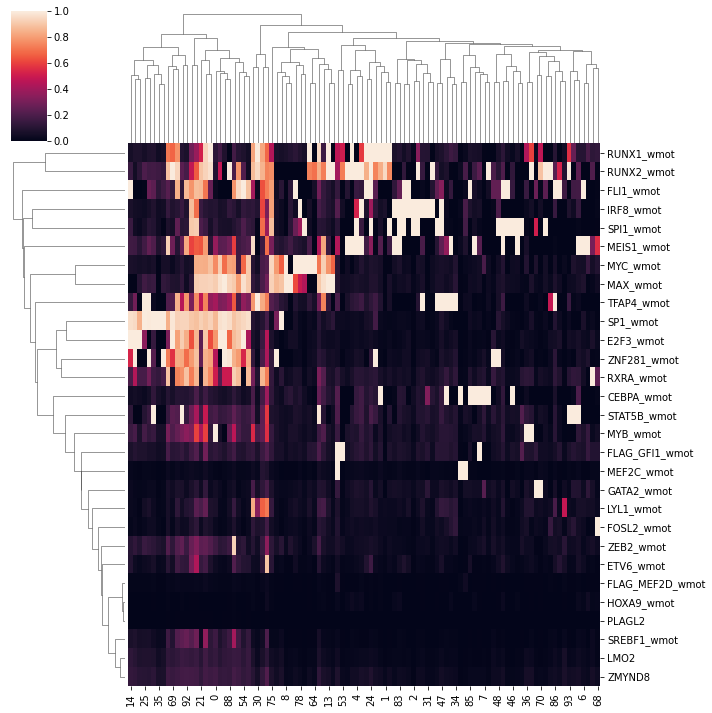

In [259]:
df = pd.DataFrame(centroid,columns=merged.columns[cols:annot]).T
#df = df/df.max()
fig = sns.clustermap(df, vmax=1)
fig.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/kmeans_'+str(n_clust[n])+'_centroids.pdf')

#### showing the cobinding matrix with the clusters

the cobinding matrix, clustered using the kmeans clusters. (see cobinding matrix description)

In [269]:
rand = np.random.choice(merged.index,5000)

subgroups = groups[rand]
sorting = np.argsort(subgroups)
rainb = cm.get_cmap('gist_rainbow', len(set(groups)))
colors = [rainb(i) for i in subgroups[sorting]]

viridis = cm.get_cmap('viridis', 256)
data = merged[merged.columns[annot:]]
for val in data.columns:
    data[val]=np.log2(1+data[val])
data = (data-data.min())/(data.max()-data.min())
data = data.iloc[rand].iloc[sorting]
for val in data.columns:
    a = [viridis(int(v*256)) for v in data[val]]
    data[val] = a
data["clusters"]  = colors

<ipython-input-269-770781c76b2b>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[val]=np.log2(1+data[val])


#### Computing enrichment on the clusters

log-enrichment of each TF/chromatin marks under each cluster (see previous enrichment plot for description) enrichment are filtered for adjusted p value below $10^{-3}$

In [270]:
enr, pvals = await chip.enrichment(merged, groups=groups)

/home/jeremie/genepy/genepy/epigenetics/chipseq.py:421: RuntimeWarning: divide by zero encountered in log2
  enrichment[i, j] = np.log2(e)


#### showing enrichment over cobinding

clustered cobinding matrix where signal for non CRC peaks has been replaced by enrichment of those over the clusters and where signal for CRC peaks has been averaged over the clusters

/home/jeremie/genepy/genepy/epigenetics/plot.py:259: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subenr[subenr<-rangeval]=-rangeval
/opt/conda/lib/python3.8/site-packages/pandas/core/frame.py:3212: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._where(-key, value, inplace=True)
/home/jeremie/genepy/genepy/epigenetics/plot.py:260: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

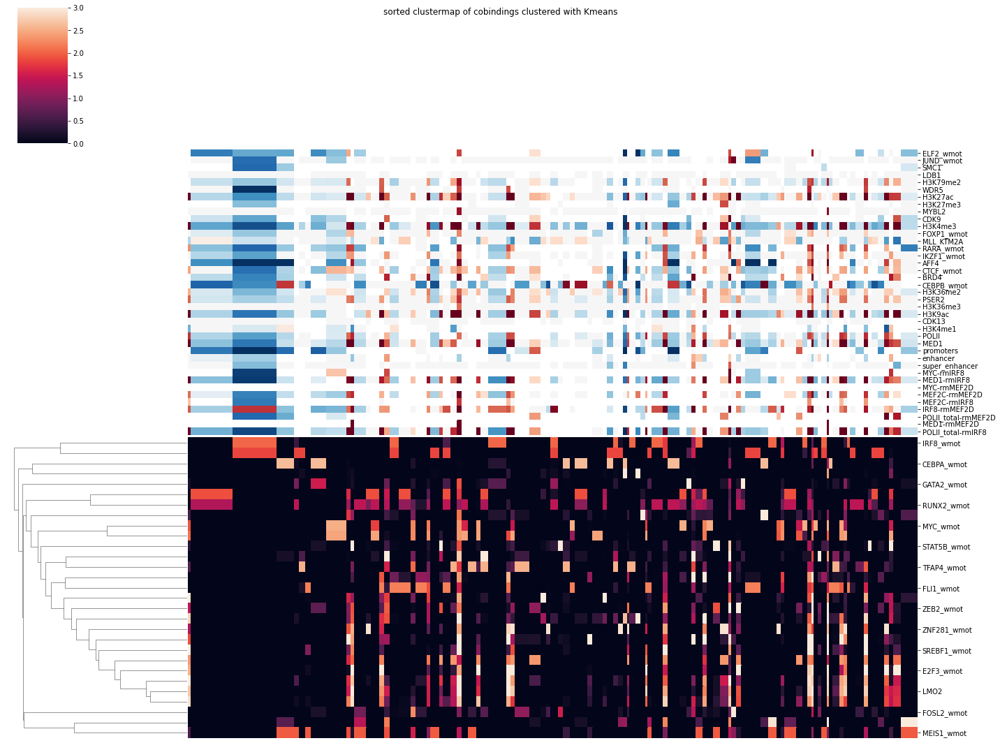

In [271]:
cplot.andrew(groups, merged, annot, enr=enr, pvals=pvals, cols=8, precise=False, folder = '../results/' + project + '/' + version + '_' + merging_version + '_' + window + '/plots/kmeans_', title = "sorted clustermap of cobindings clustered with Kmeans")

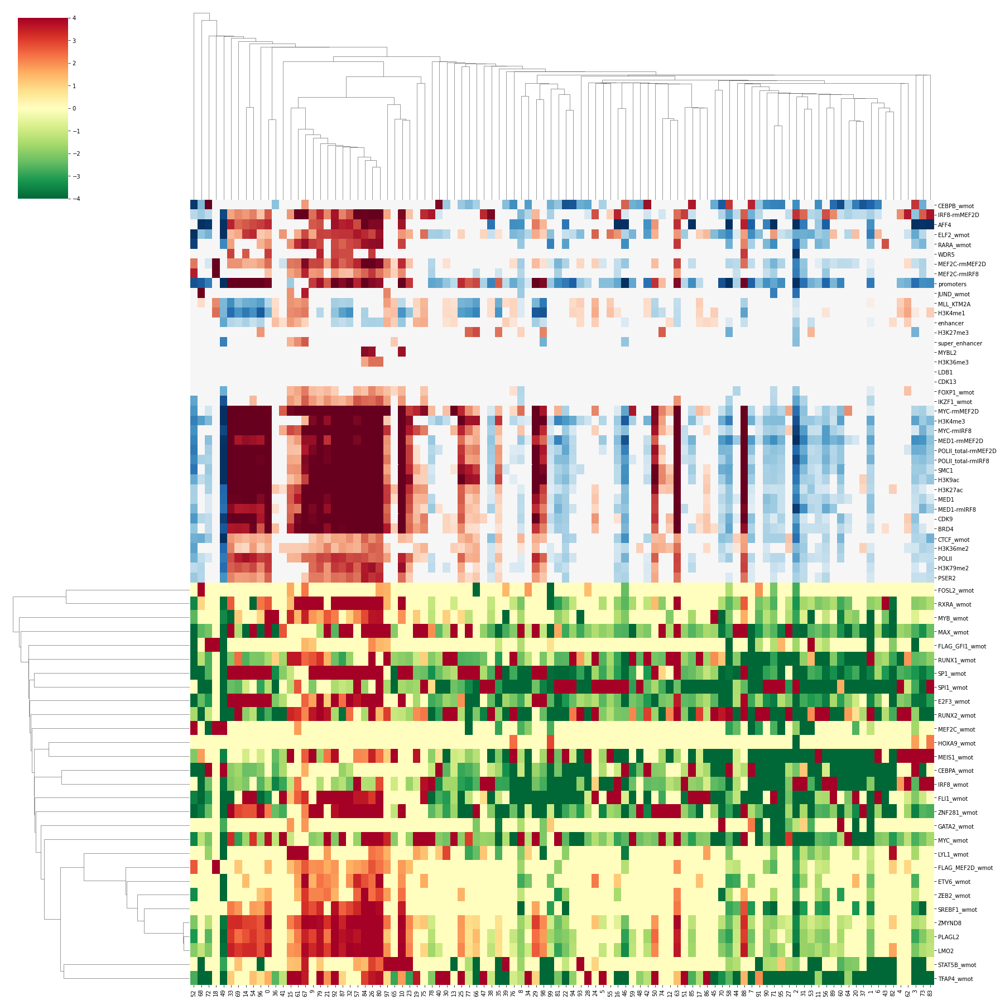

In [272]:
maxv=4
rdb = cm.get_cmap('RdBu_r', 256)
rdy = cm.get_cmap('RdGy_r', 256)
vals = merged.columns[cols:annot]
col = enr.loc[merged.columns[annot:]].copy().T
col[col<-maxv]=-maxv
col[col>maxv]=maxv
col = col/maxv
collink = linkage(enr.loc[merged.columns[cols:annot]].T, metric="cosine")
rowlink = linkage(enr.loc[merged.columns[cols:annot]], metric="cosine")
rowlinkAdd = linkage(enr.loc[merged.columns[annot:]])
for val in merged.columns[annot:].tolist():
    col[val] =[rdb(128+int(v*128)) for v in col[val]]
col = col[[col.columns[i] for i in leaves_list(rowlinkAdd)]]
fig = sns.clustermap(enr.loc[merged.columns[cols:annot]], figsize=(25,25), vmax=4, vmin=-4, cmap='RdYlGn_r', col_colors=col, colors_ratio=0.01, col_linkage=collink, row_linkage=rowlink)
fig.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/motifs_and_crc_enrichment_on_clusters_'+str(n_clust[n])+'_v1.pdf')
plt.show()

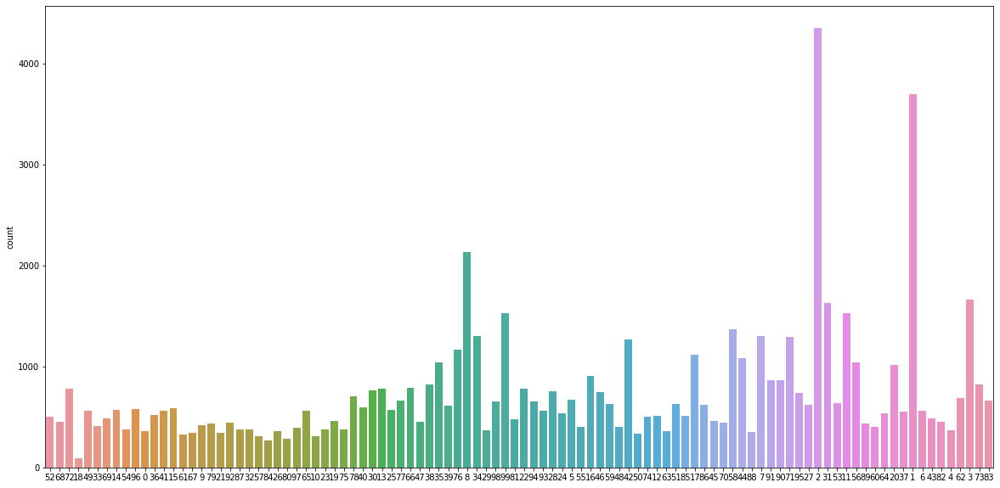

In [273]:
f, ax = plt.subplots(figsize=(20,10))
sns.countplot(groups.astype(str).tolist(), ax=ax, order=leaves_list(collink).astype(str).tolist())
plt.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/custer_size_'+str(n_clust[n])+'.pdf')

## Using SOMs

Kohonen [Self-Organizing Maps](https://medium.com/@dalicodes/overview-of-self-organizing-maps-som-with-its-python-implementation-in-determining-safe-airlines-db8f6018a2b). Each nodes learn to recognize a pattern in the dataset, unregarding of its distribution. Each node tries to be as similar as possible to its close neighboor and dissimilar to nodes further away. This allows to reduce dimensionality of the dataset, unregarding of distances. This makes a lot of sense for our data type. we end up with a map of 400 datapoints which represent the binding code in the dataset.

In [274]:
#Import the library
size = 20
#Build a network 20x20 with a weights format taken from the raw_data and activate Periodic Boundary Conditions. 
net = sps.somNet(size,size, scaled_data, PBC=True)

#Train the network for 10000 epochs and with initial learning rate of 0.01. 
net.train(0.01, 10000)

#Save the weights to file
net.save('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/cobinding_SOMweights_'+str(size))

Periodic Boundary Conditions active.
The weights will be initialised randomly.
Training SOM... done!


In [ ]:
net = sps.somNet(0,0, scaled_data, loadFile='../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/cobinding_SOMweights_'+str(size), PBC=True)

In [275]:
pathplot = "../results/"+project+'/'+version+'_'+merging_version+'_'+window+"/plots/somNets/"
! mkdir $pathplot

### SOMnode enrichment

displays a map of each node, respecting 2D neighboorhood. and its enrichment for a specific protein/mark.

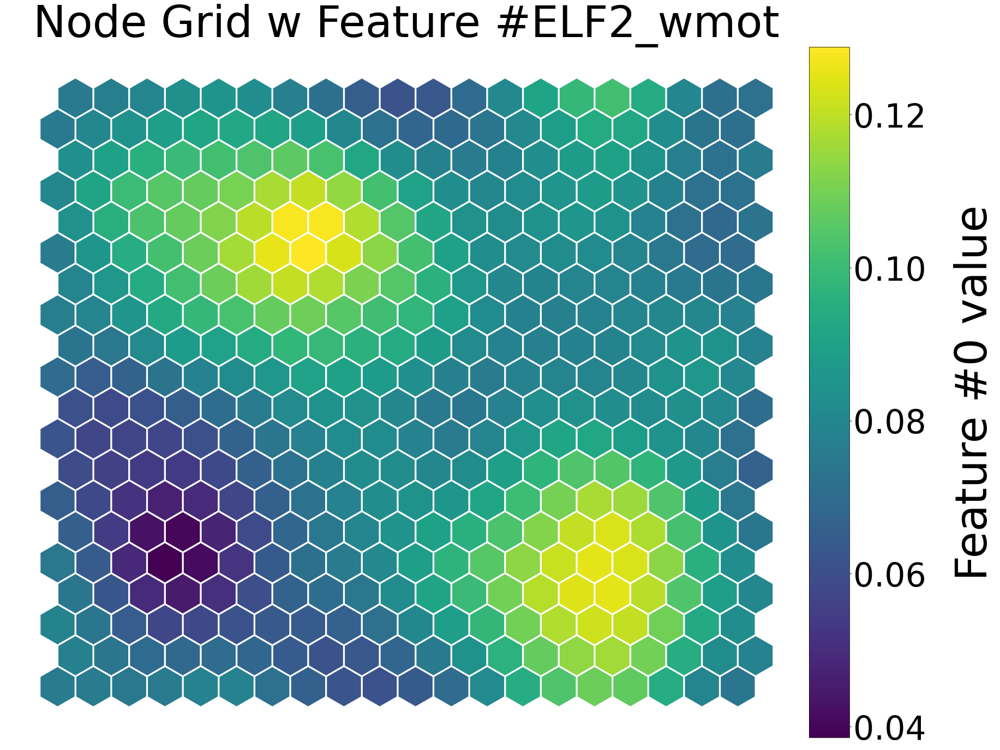

<Figure size 432x288 with 0 Axes>

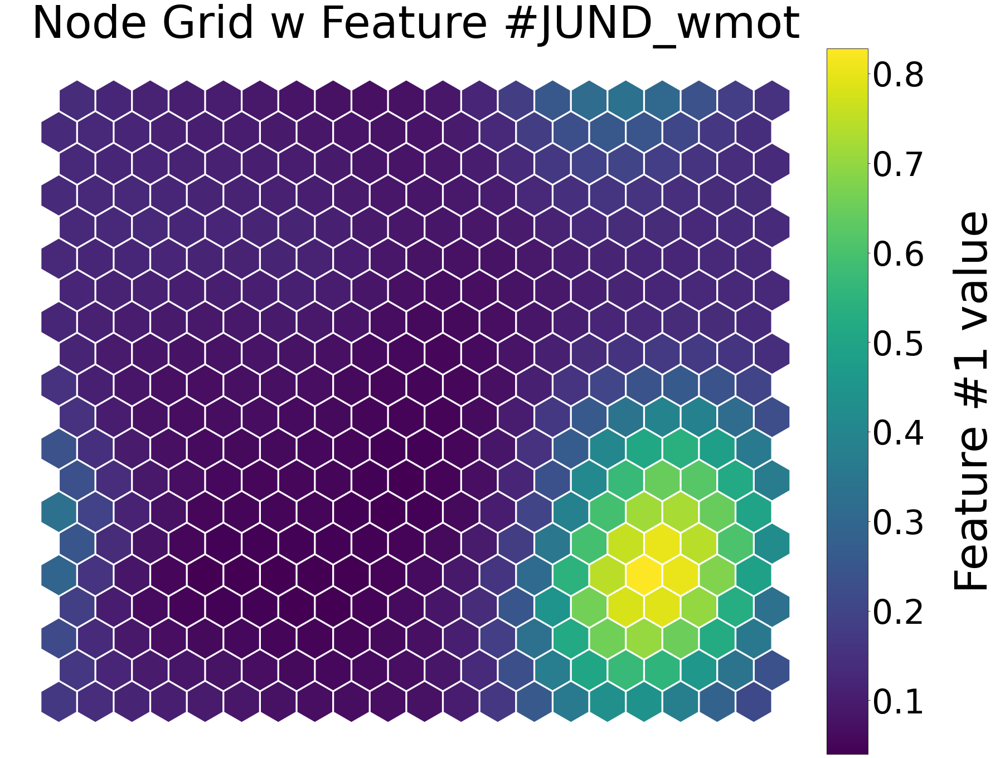

<Figure size 432x288 with 0 Axes>

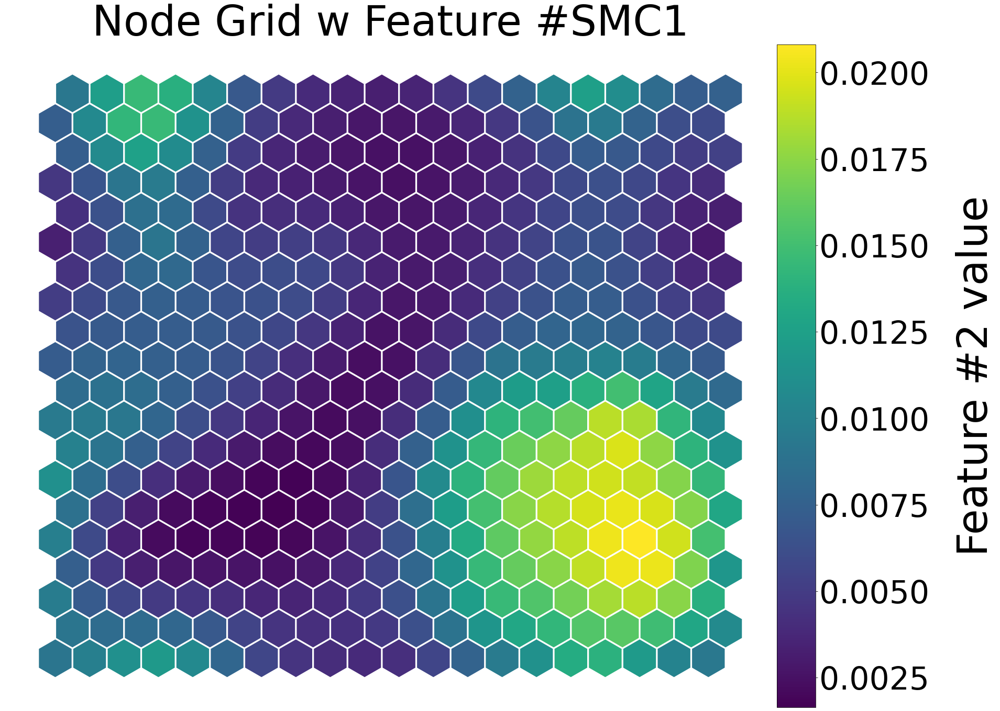

<Figure size 432x288 with 0 Axes>

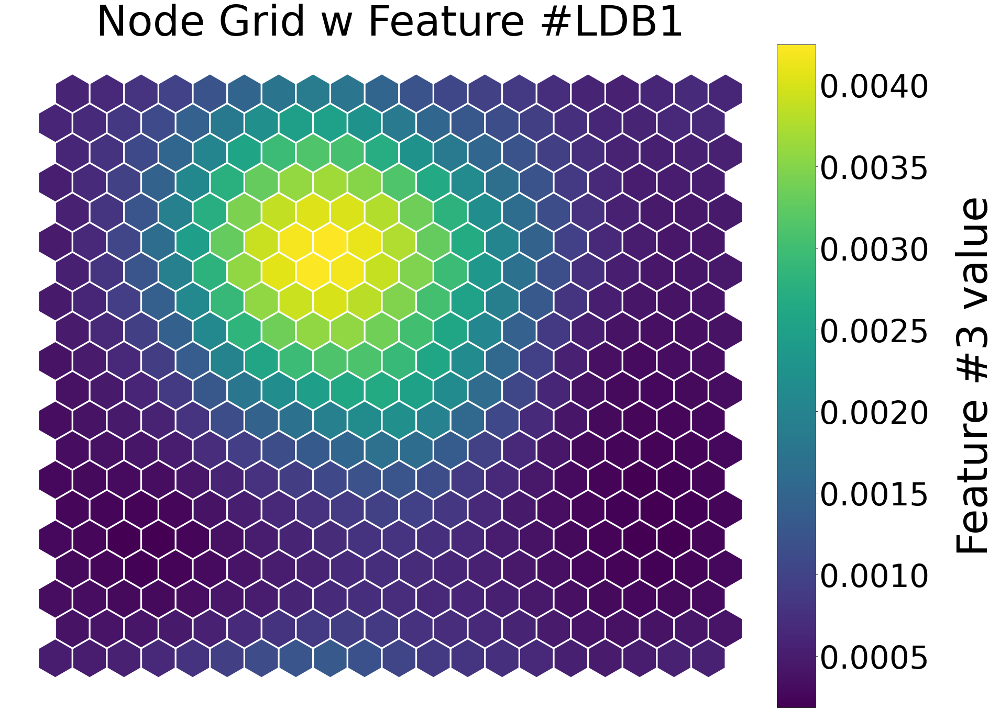

<Figure size 432x288 with 0 Axes>

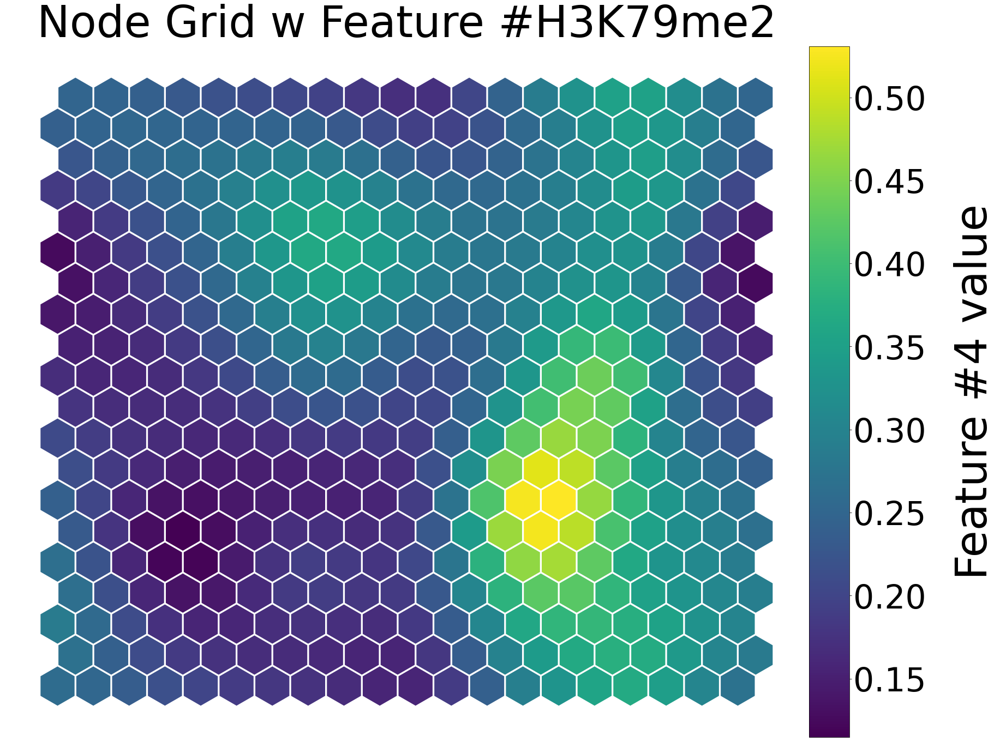

<Figure size 432x288 with 0 Axes>

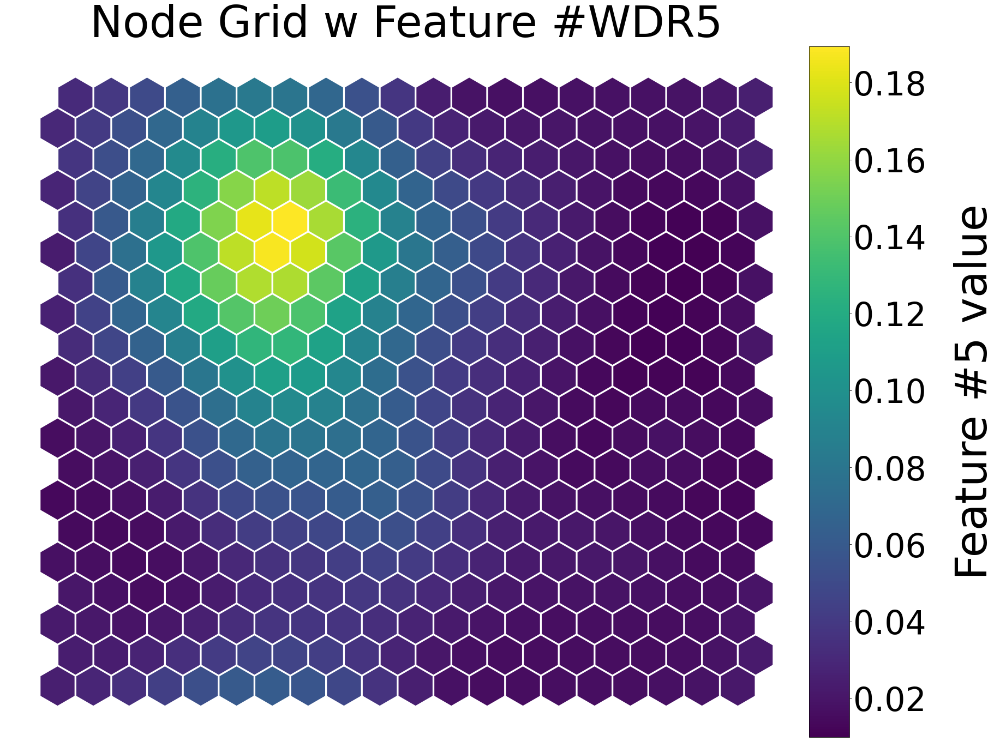

<Figure size 432x288 with 0 Axes>

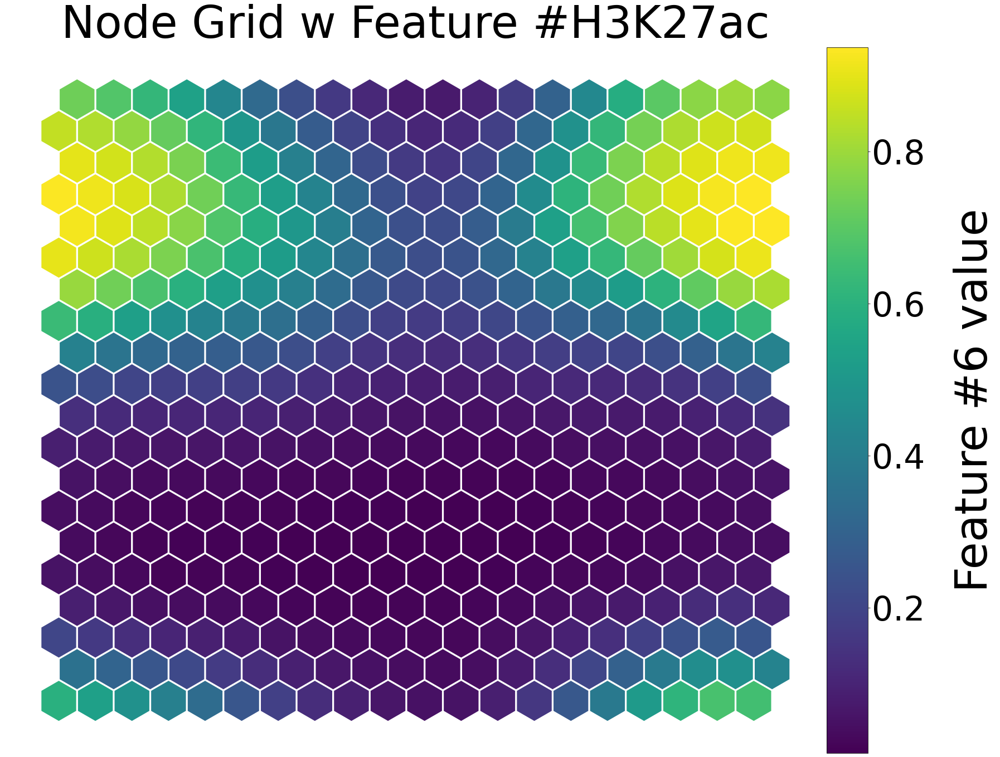

<Figure size 432x288 with 0 Axes>

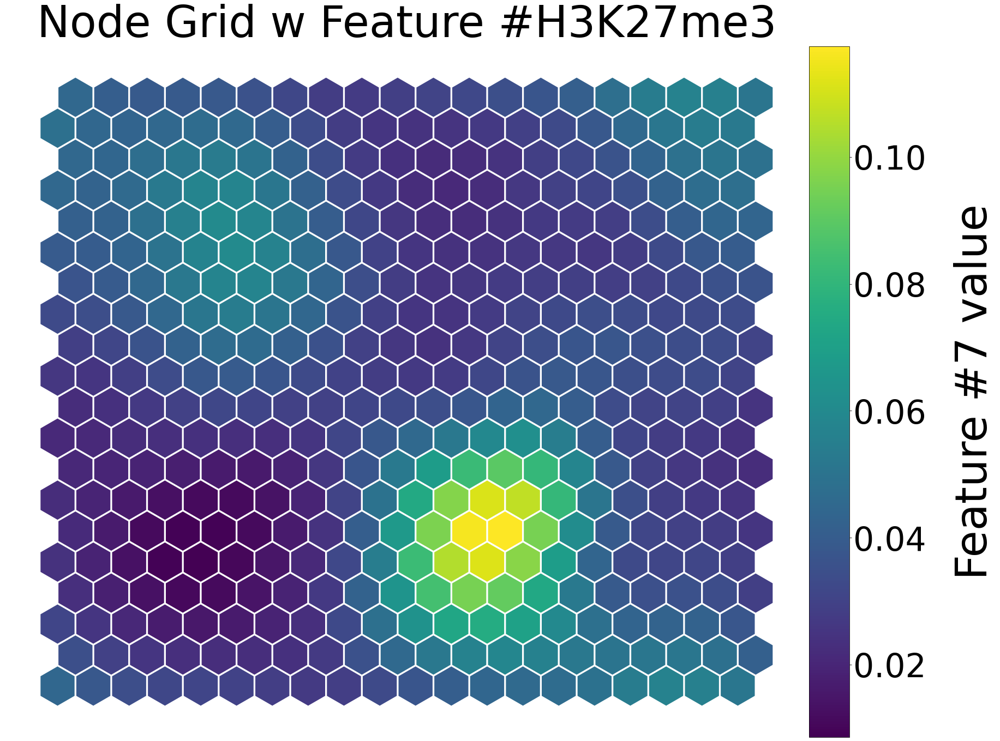

<Figure size 432x288 with 0 Axes>

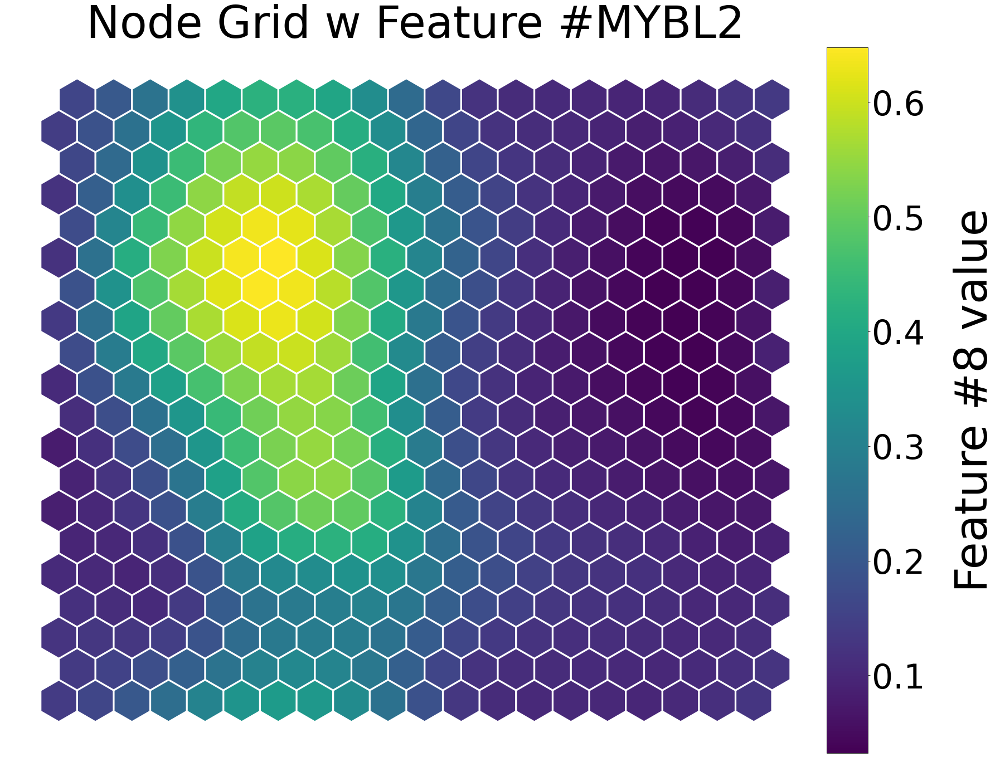

<Figure size 432x288 with 0 Axes>

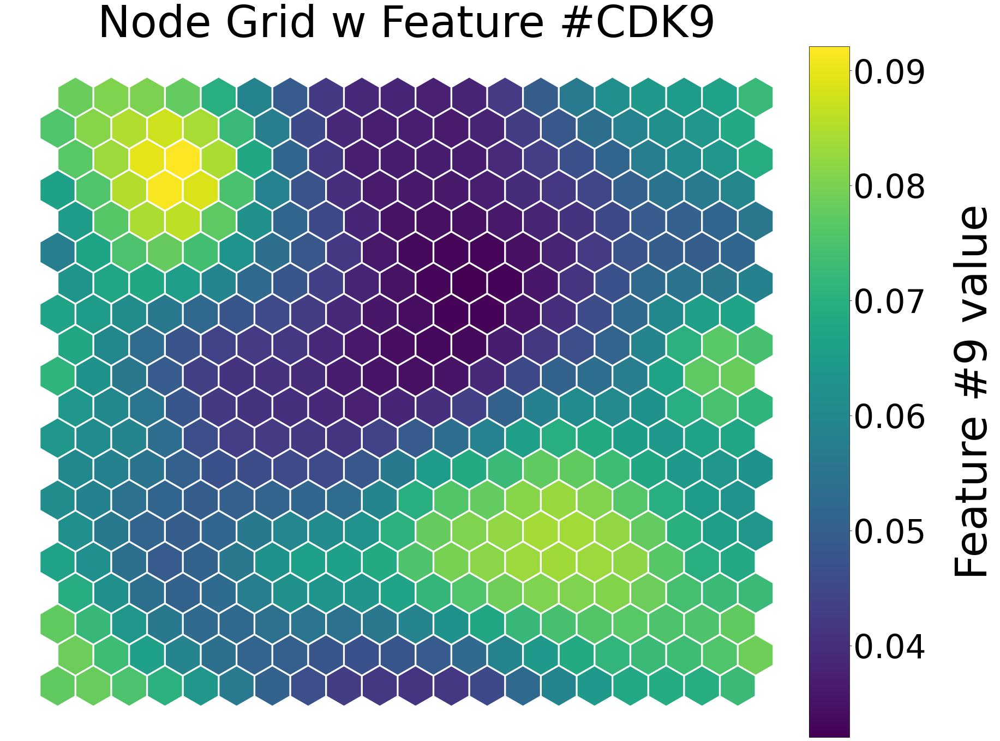

<Figure size 432x288 with 0 Axes>

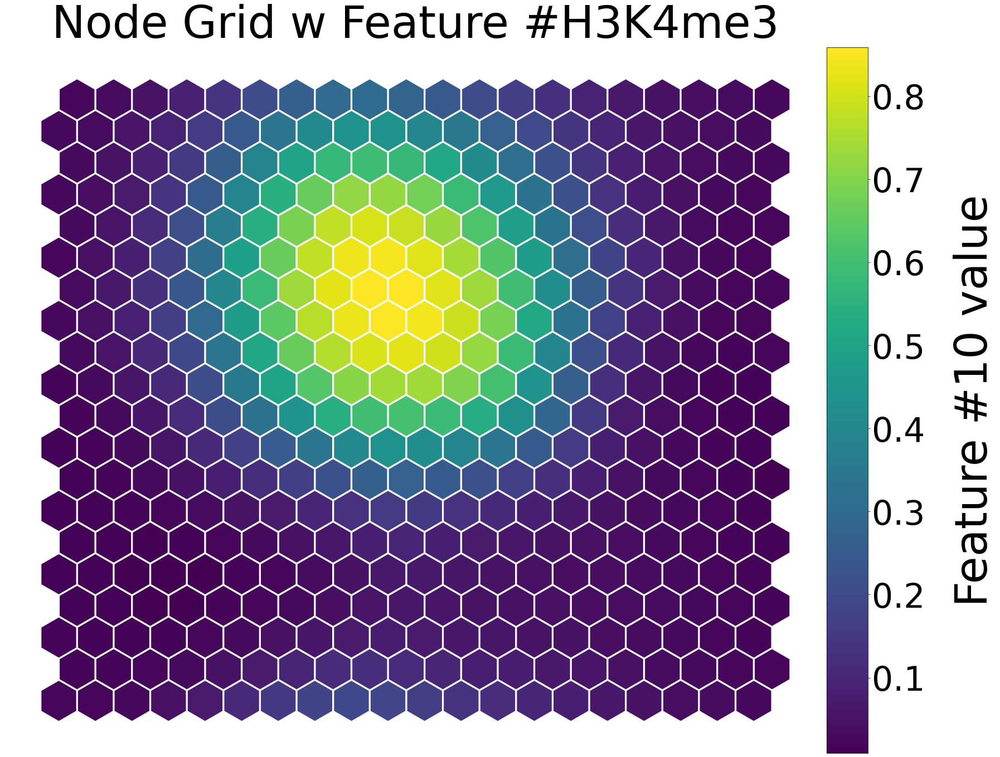

<Figure size 432x288 with 0 Axes>

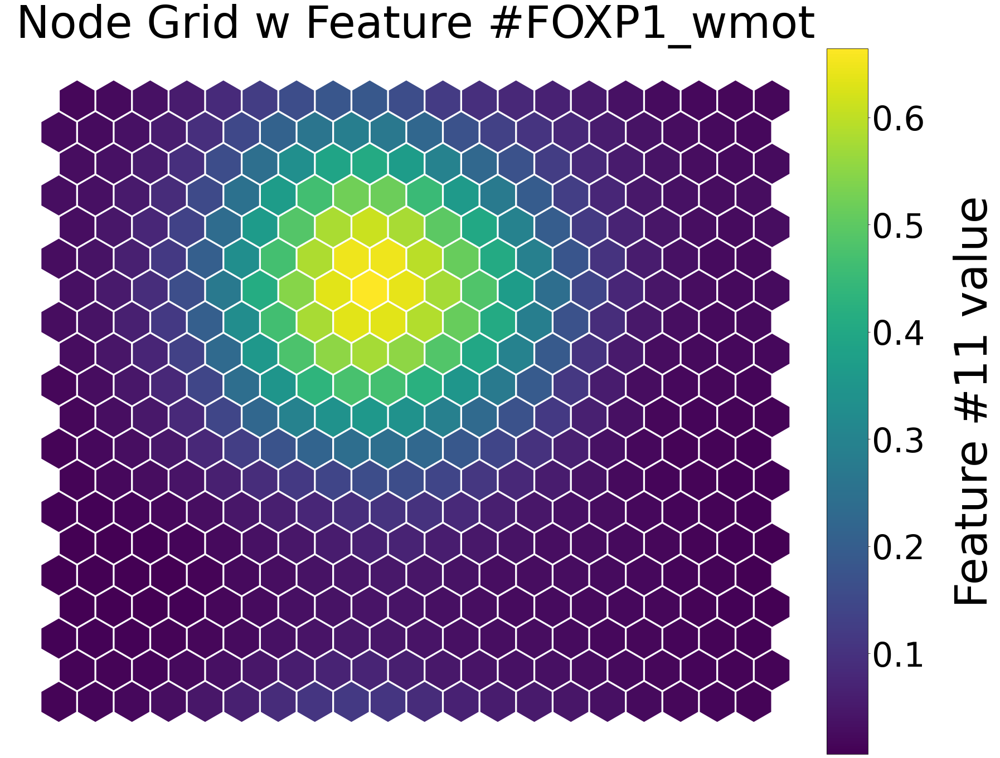

<Figure size 432x288 with 0 Axes>

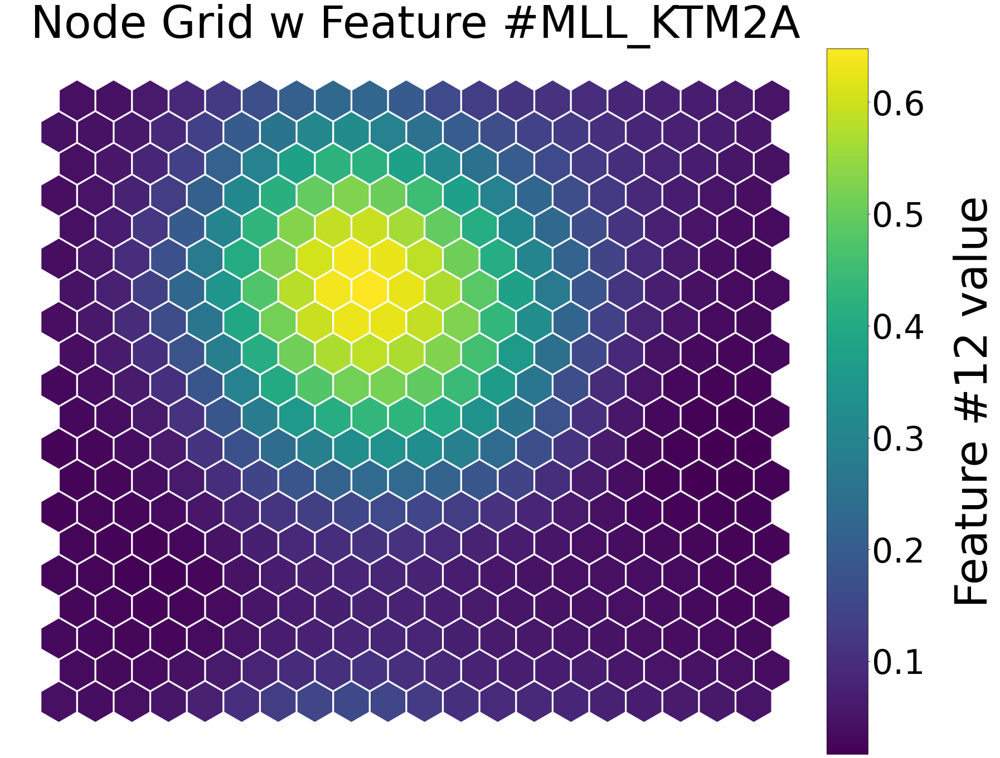

<Figure size 432x288 with 0 Axes>

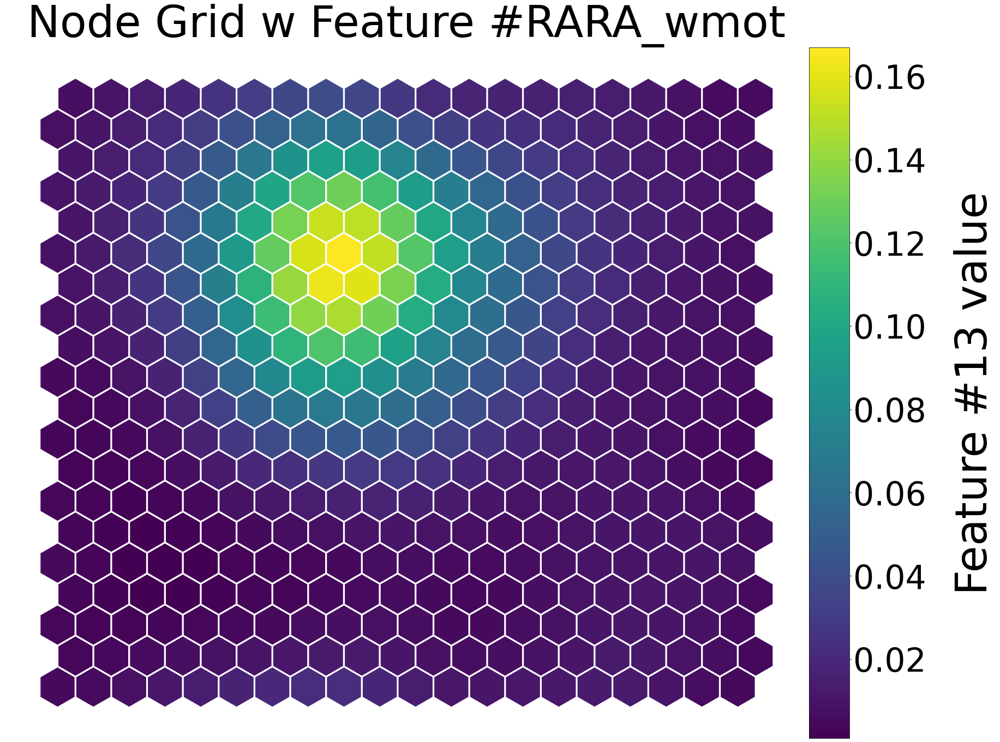

<Figure size 432x288 with 0 Axes>

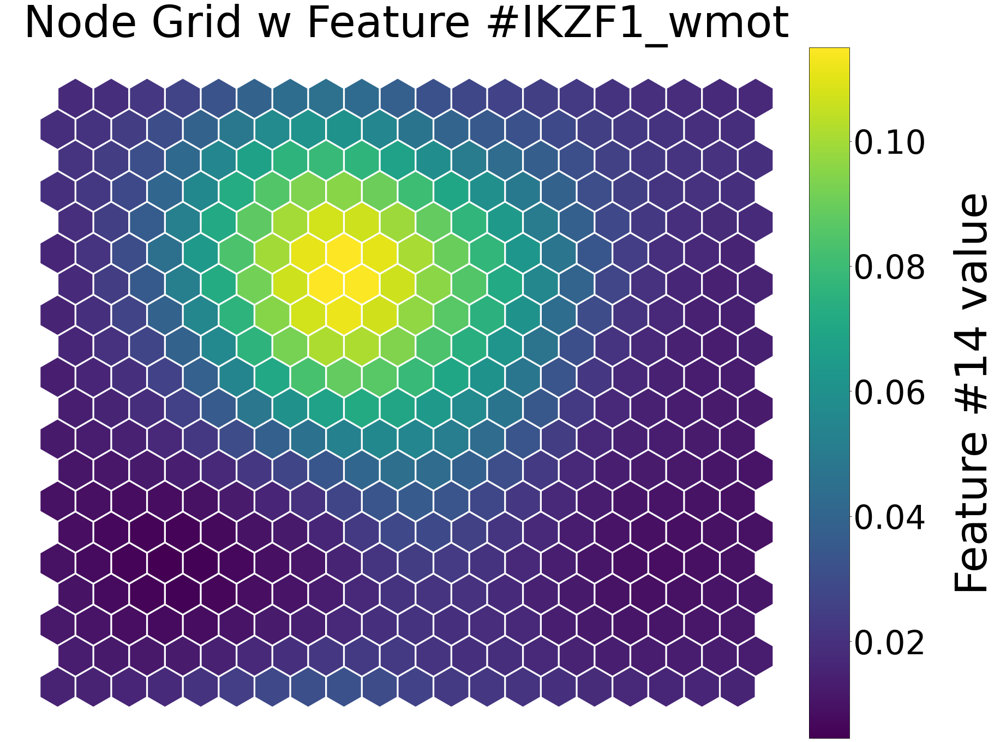

<Figure size 432x288 with 0 Axes>

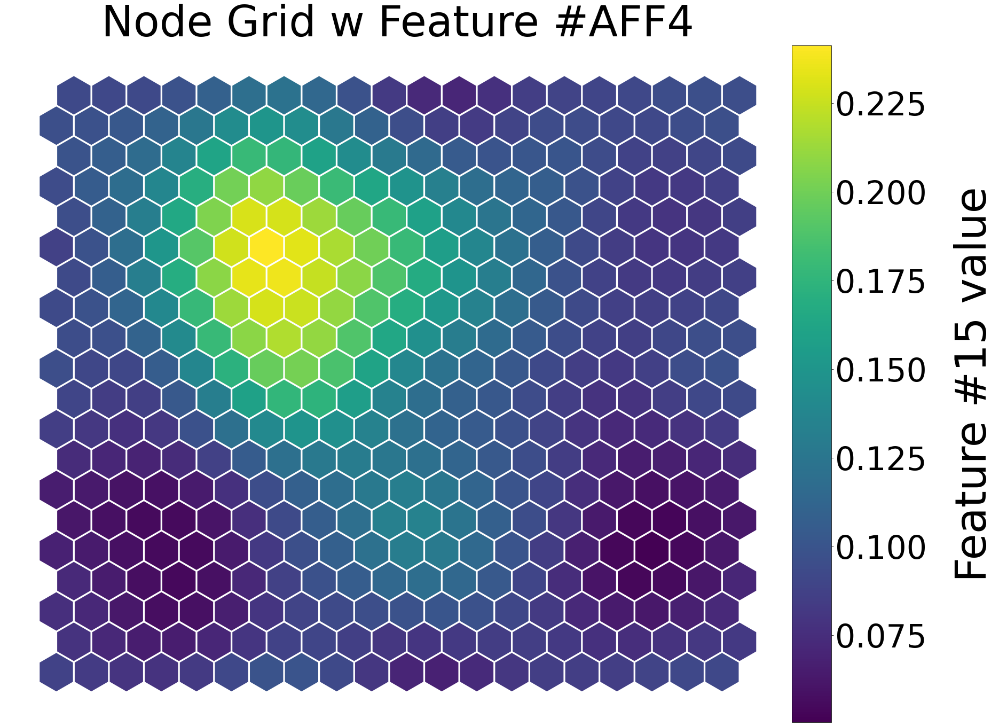

<Figure size 432x288 with 0 Axes>

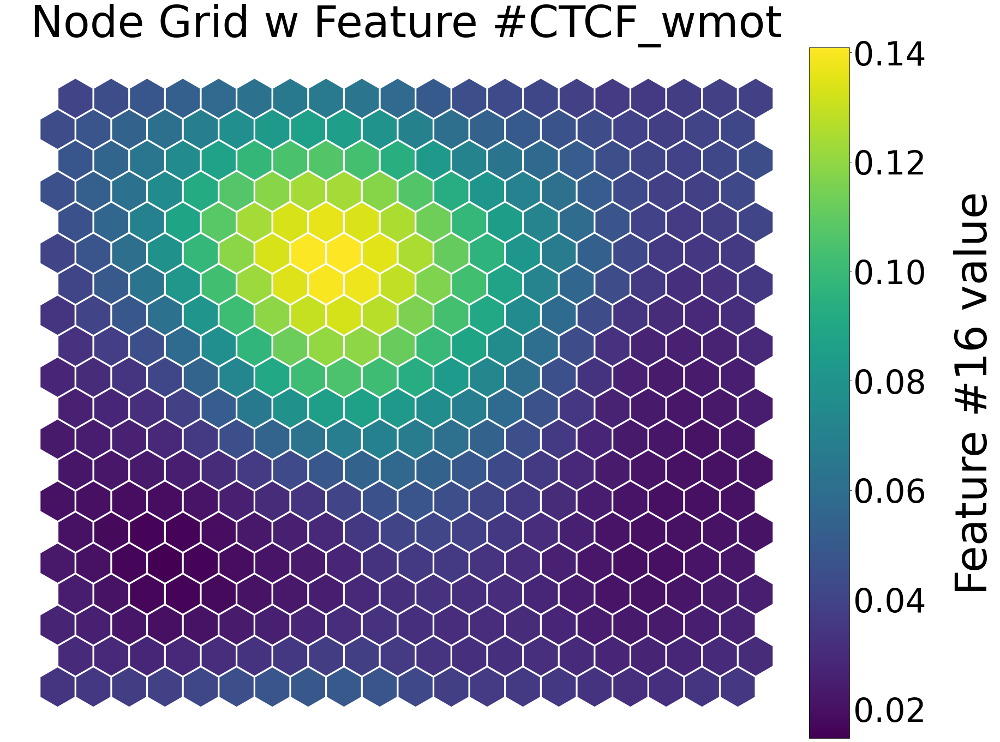

<Figure size 432x288 with 0 Axes>

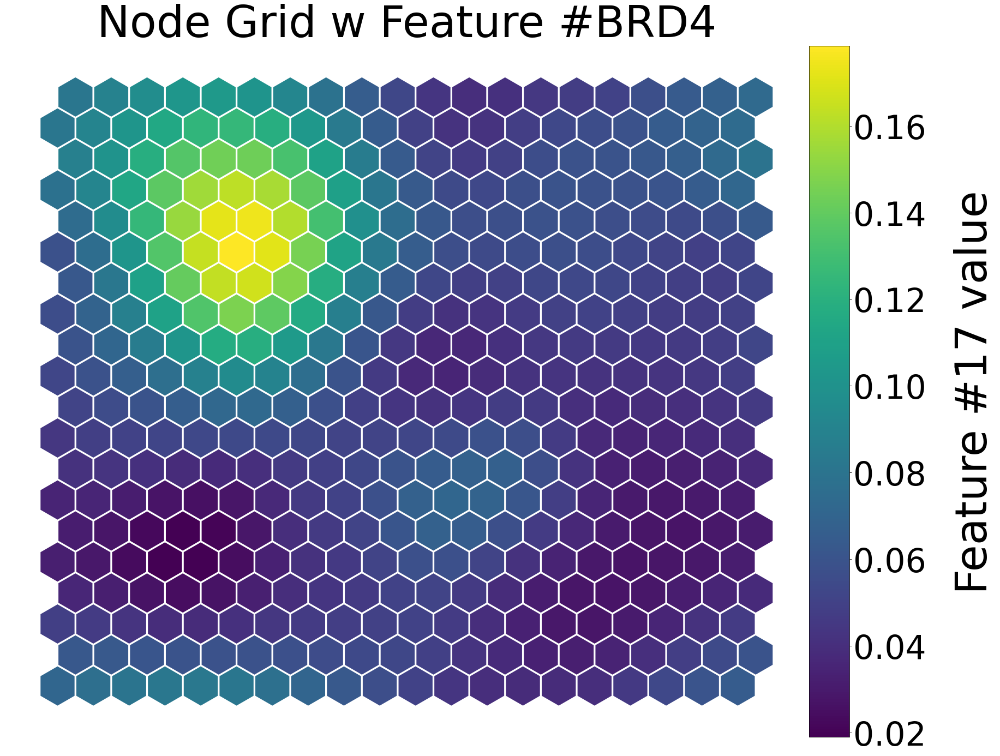

<Figure size 432x288 with 0 Axes>

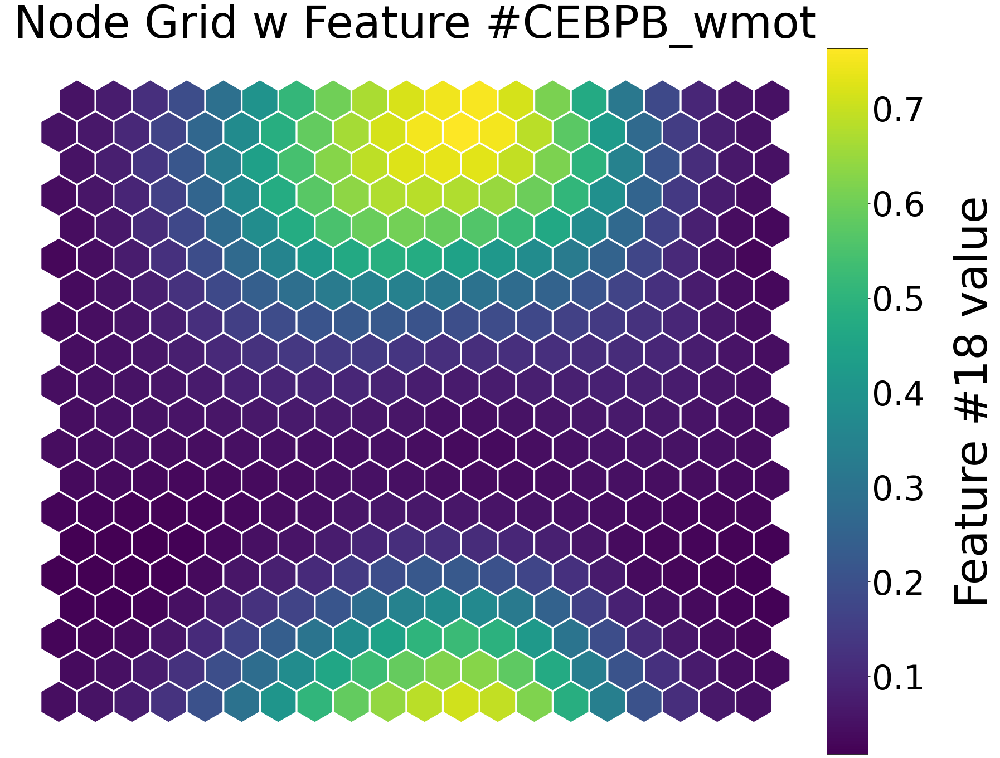

<Figure size 432x288 with 0 Axes>

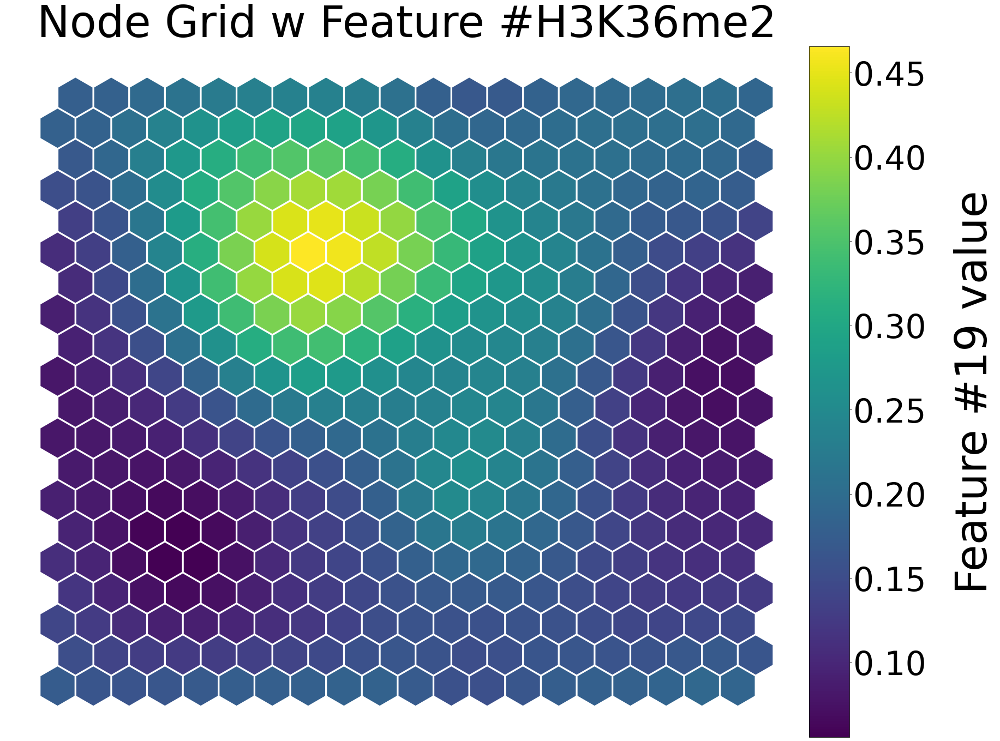

<Figure size 432x288 with 0 Axes>

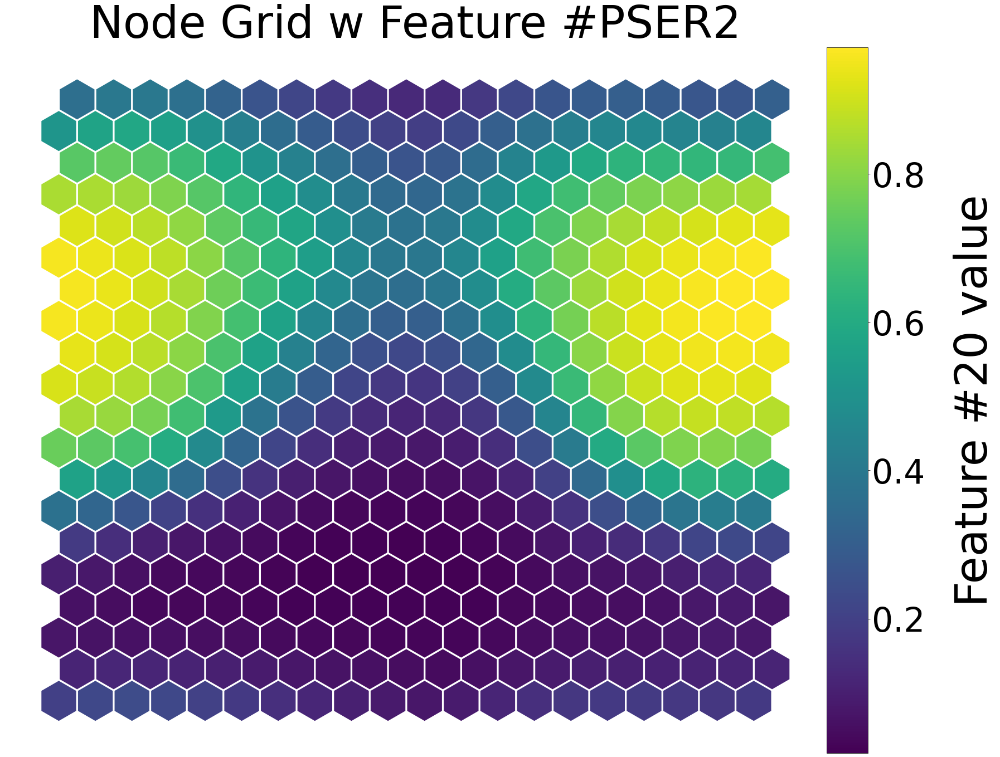

<Figure size 432x288 with 0 Axes>

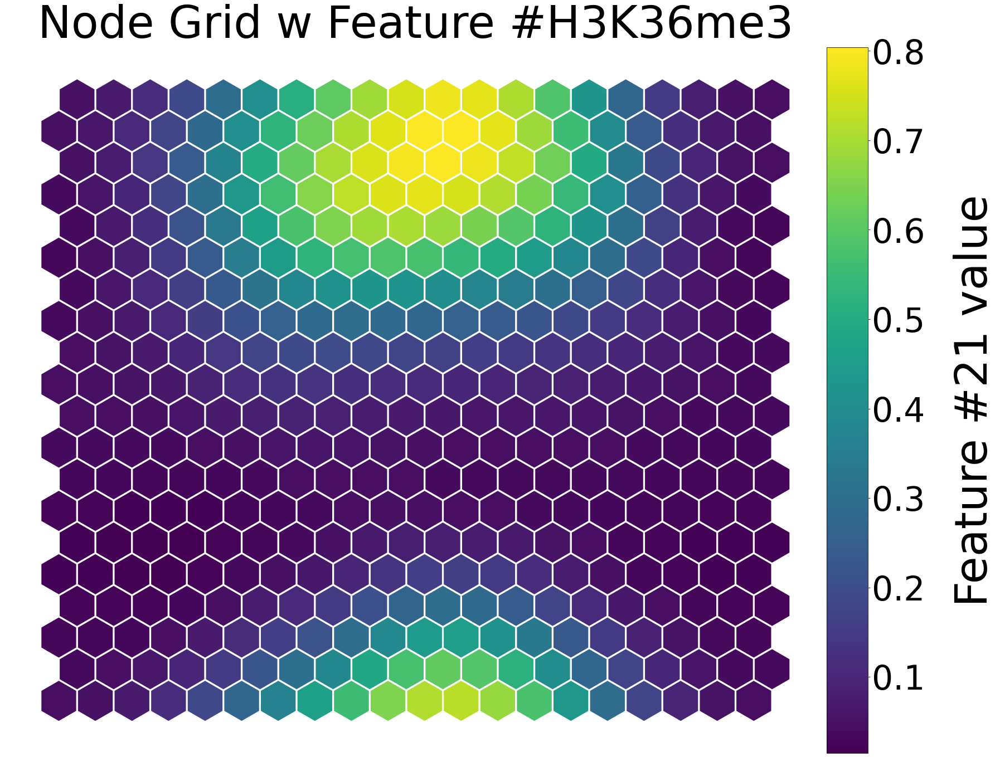

<Figure size 432x288 with 0 Axes>

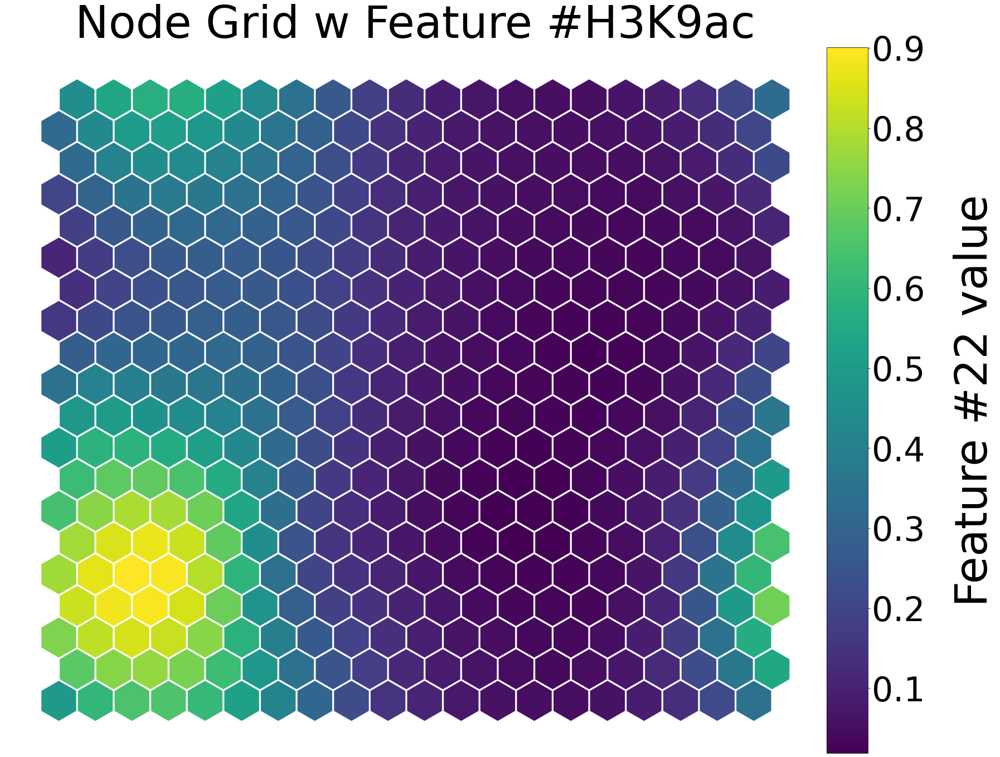

<Figure size 432x288 with 0 Axes>

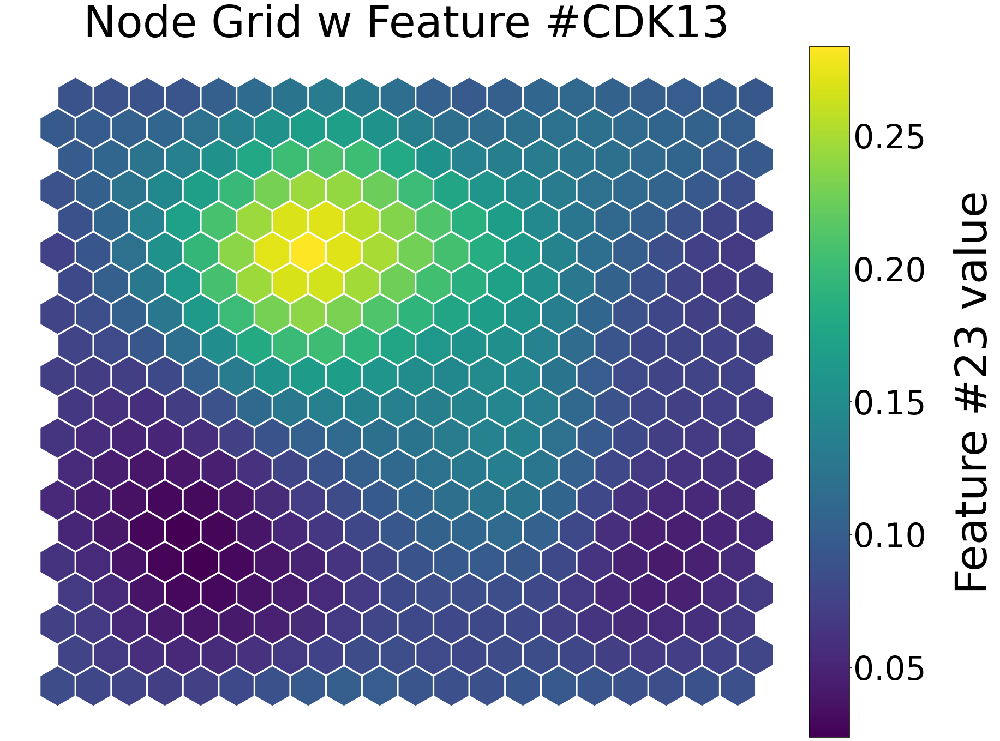

<Figure size 432x288 with 0 Axes>

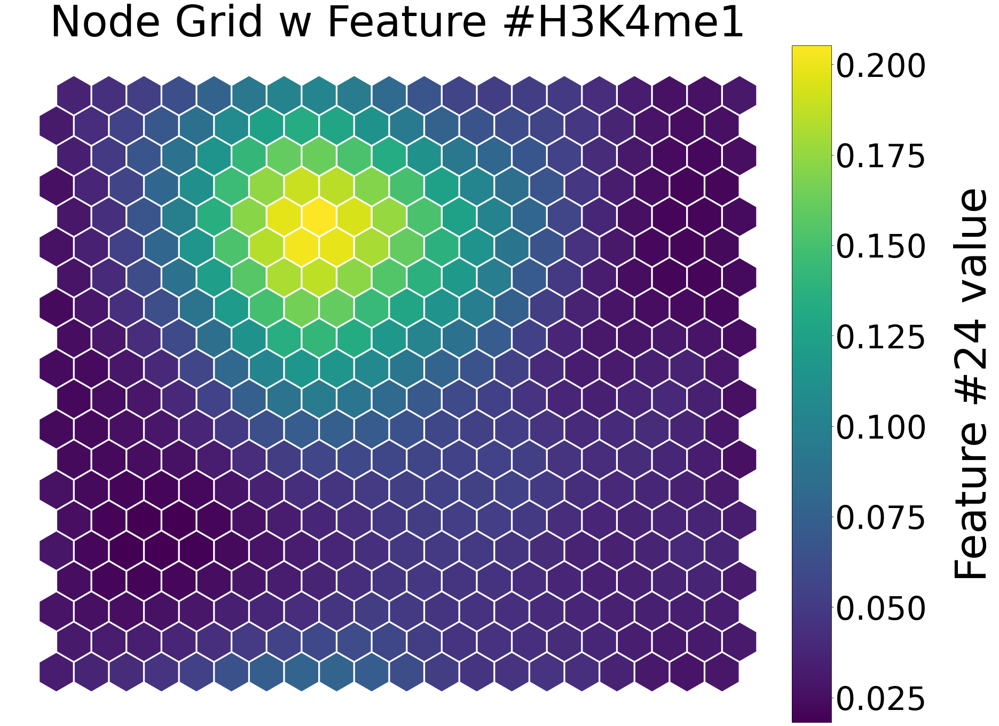

<Figure size 432x288 with 0 Axes>

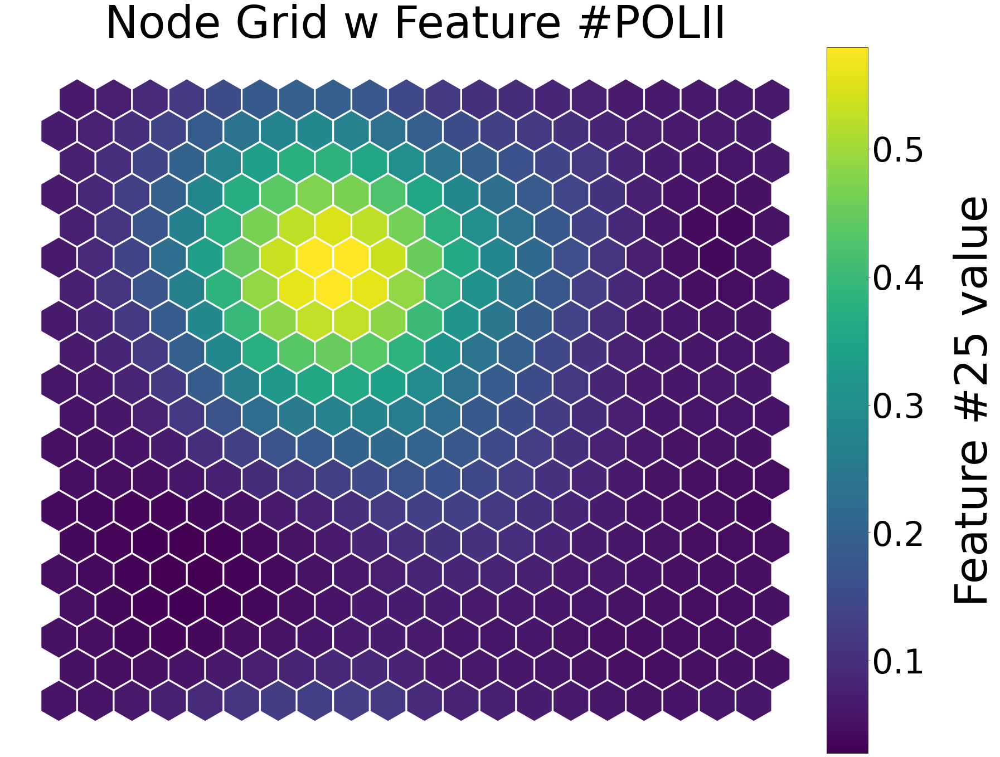

<Figure size 432x288 with 0 Axes>

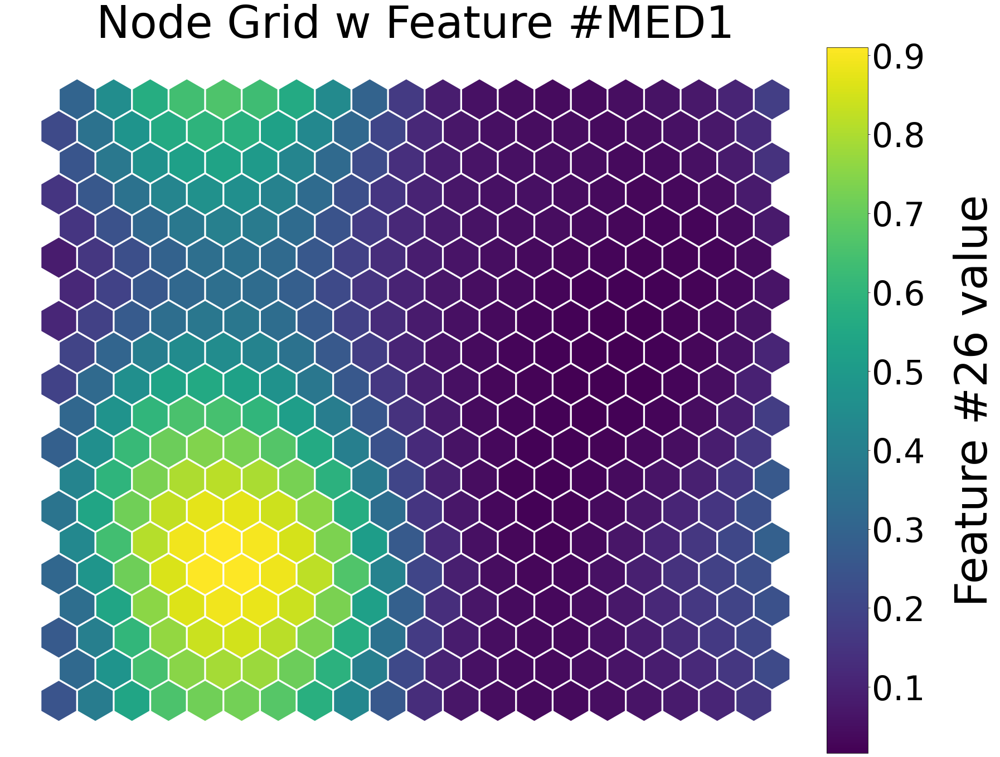

<Figure size 432x288 with 0 Axes>

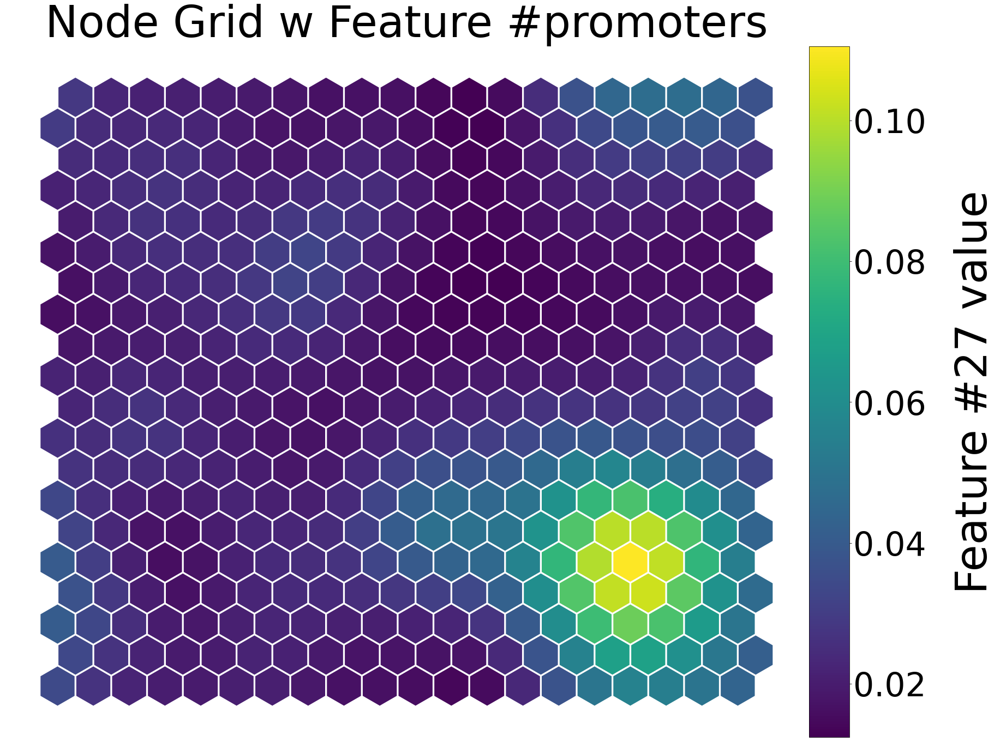

<Figure size 432x288 with 0 Axes>

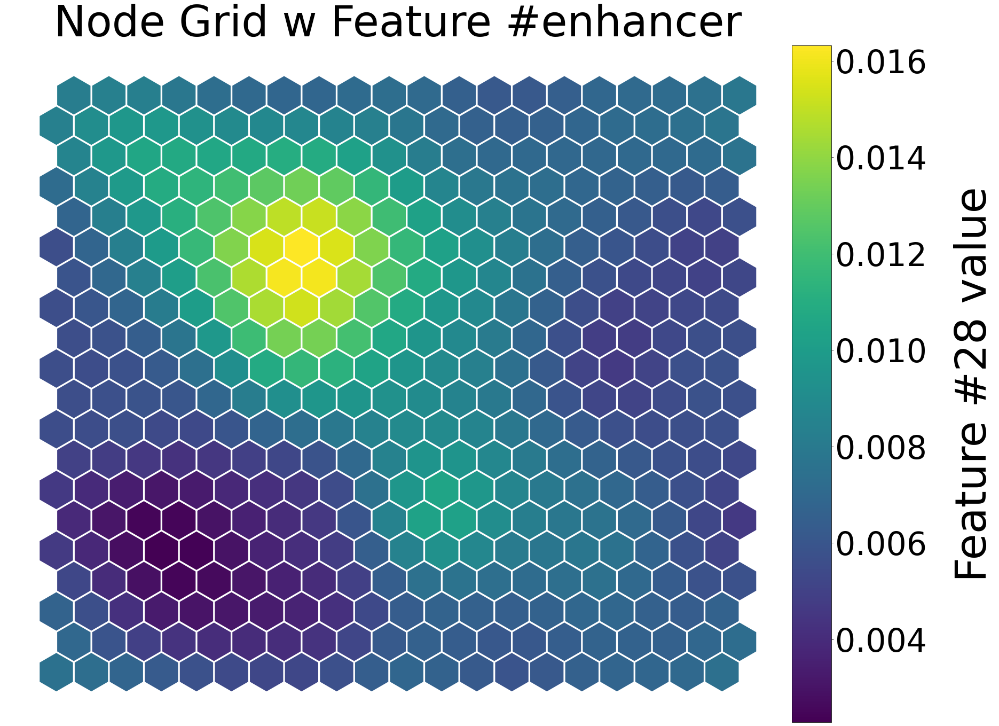

<Figure size 432x288 with 0 Axes>

In [276]:
#Print a map of the network nodes and colour them according to the first feature (column number 0) of the dataset
#and then according to the distance between each node and its neighbours.
for col in range(scaled_data.shape[1]):
    net.nodes_graph(colnum=col, printout=True, show=True, path="../results/"+project+'/'+version+'_'+merging_version+'_'+window+"/plots/somNets/", colname=data.columns[col])

### average differential enrichment
displays similarity in what the nodes have learnt. how different the sum of their weight is compared to their neighboors.

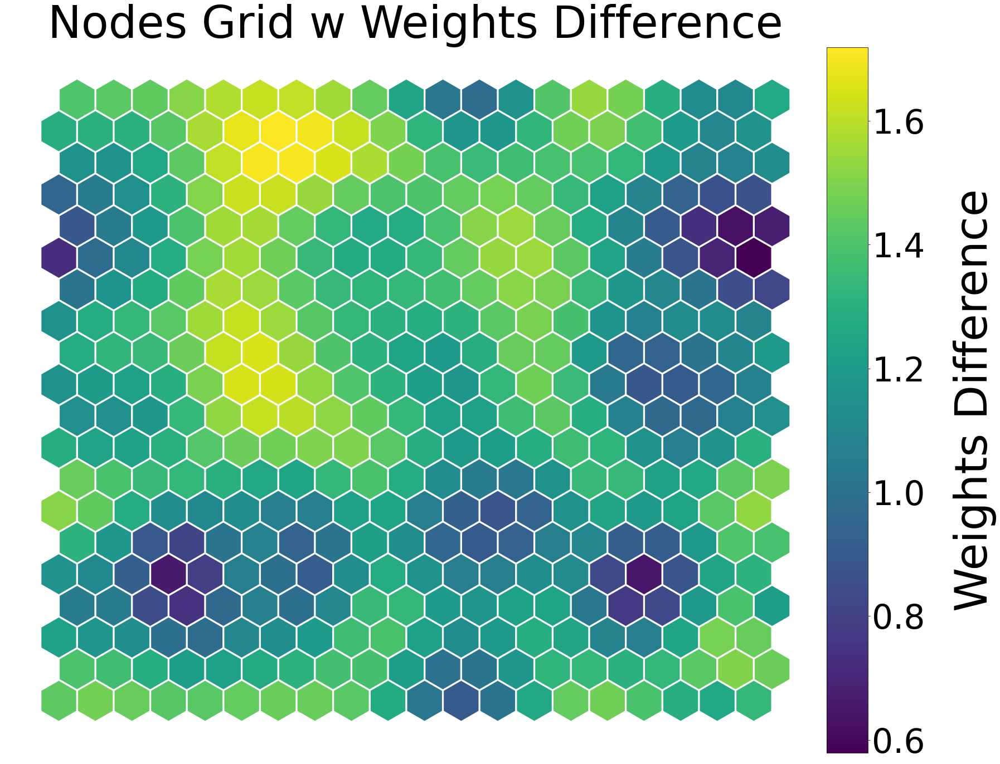

In [277]:
diffs = net.diff_graph(show=False, returns=True)
plt.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/cobinding_SOM'+str(size)+'.pdf')

### interactive somPlot

displays the same differential map as above. but allows the user to look at the key TF/marks that are enriched in the node (might be more than one) this is very sensitive on the filter used to defined what is enriched and what is not.

/home/jeremie/.local/lib/python3.8/site-packages/bokeh/io/saving.py:125: UserWarning: save() called but no resources were supplied and output_file(...) was never called, defaulting to resources.CDN
  warn("save() called but no resources were supplied and output_file(...) was never called, defaulting to resources.CDN")
/home/jeremie/.local/lib/python3.8/site-packages/bokeh/io/saving.py:138: UserWarning: save() called but no title was supplied and output_file(...) was never called, using default title 'Bokeh Plot'
  warn("save() called but no title was supplied and output_file(...) was never called, using default title 'Bokeh Plot'")


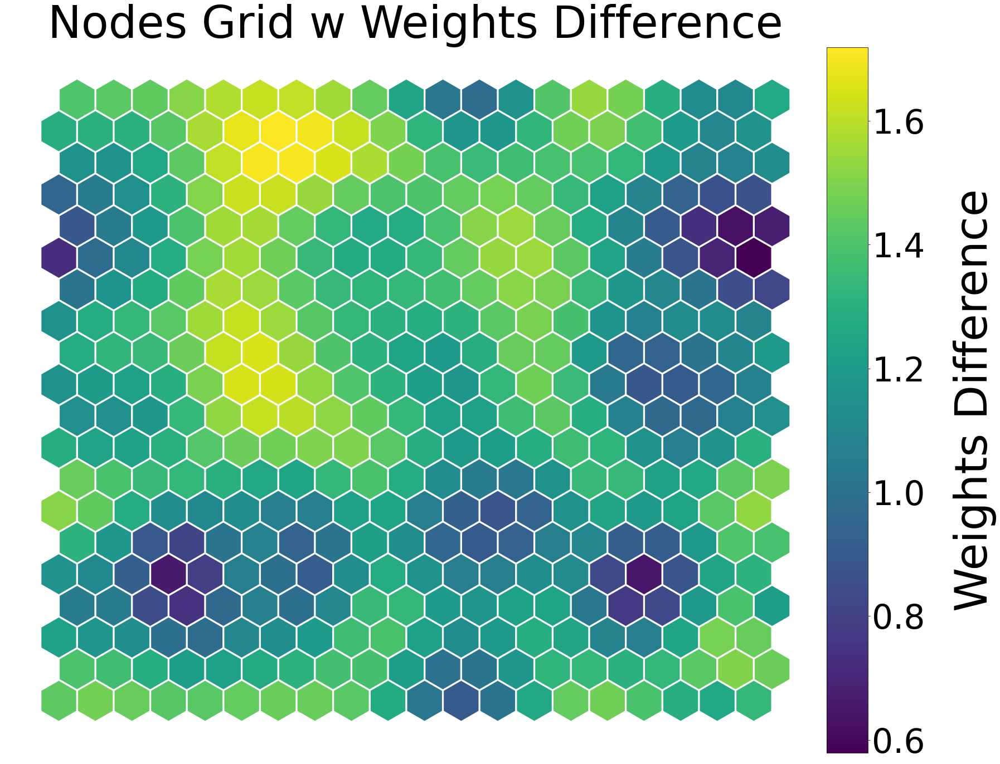

In [285]:
plot.SOMPlot(net, size=size, colnames=merged.columns[cols:annot], folder='../results/' + project + '/' + version + '_' + merging_version + '_'+window+"/plots/onbool_", minweight=0.4)

### enrichment of SOMnodes

Which node is mostly enriched in which specific signal? the color represent the amount of points mostly recognized that node. the more points, the stronger the enrichment.

Here we have which node recognize signal from super enhancers

In [279]:
prj=np.array(net.project(scaled_data[merged['super_enhancer']!=0]))

<Figure size 432x288 with 0 Axes>

In [280]:
plot.bigScatter(prj,binsize=0.5,showpoint=False,precomputed=False, logscale=True, title='density plot of enhancers in TF cobinding space with TSNE', folder='../results/'+project+'/'+version+'_'+merging_version+'_'+window+"/plots/")

/home/jeremie/.local/lib/python3.8/site-packages/bokeh/io/saving.py:125: UserWarning: save() called but no resources were supplied and output_file(...) was never called, defaulting to resources.CDN
  warn("save() called but no resources were supplied and output_file(...) was never called, defaulting to resources.CDN")
/home/jeremie/.local/lib/python3.8/site-packages/bokeh/io/saving.py:138: UserWarning: save() called but no title was supplied and output_file(...) was never called, using default title 'Bokeh Plot'
  warn("save() called but no title was supplied and output_file(...) was never called, using default title 'Bokeh Plot'")


Figure(id='7113', ...)

In [281]:
#Cluster the datapoints according to the Quality Threshold algorithm.
clusts = net.cluster(scaled_data, type='KMeans',numcl=n_clust[n])
sorting  = []
for clust in clusts:
    sorting.extend(clust)
sorting = np.array(sorting)

<Figure size 432x288 with 0 Axes>

In [282]:
viridis = cm.get_cmap('gist_rainbow', len(clusts))
colors=[]
for i, clust in enumerate(clusts):
    colors.extend([viridis(i)]*len(clust))
colors = np.array(colors)
viridis = cm.get_cmap('viridis', 256)
data = merged[merged.columns[annot:]]
for val in data.columns:
    data[val] = np.log2(1+data[val])
data = (data-data.min())/(data.max()-data.min())
rand = np.random.choice(range(len(sorting)),5000)
rand.sort()
data = data.iloc[sorting[rand]]
for val in data.columns:
    a = [viridis(int(v*256)) for v in data[val]]
    data[val] = a
data["clusters"]  = [tuple(i) for i in colors[rand]]

<ipython-input-282-3d497b534963>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[val] = np.log2(1+data[val])


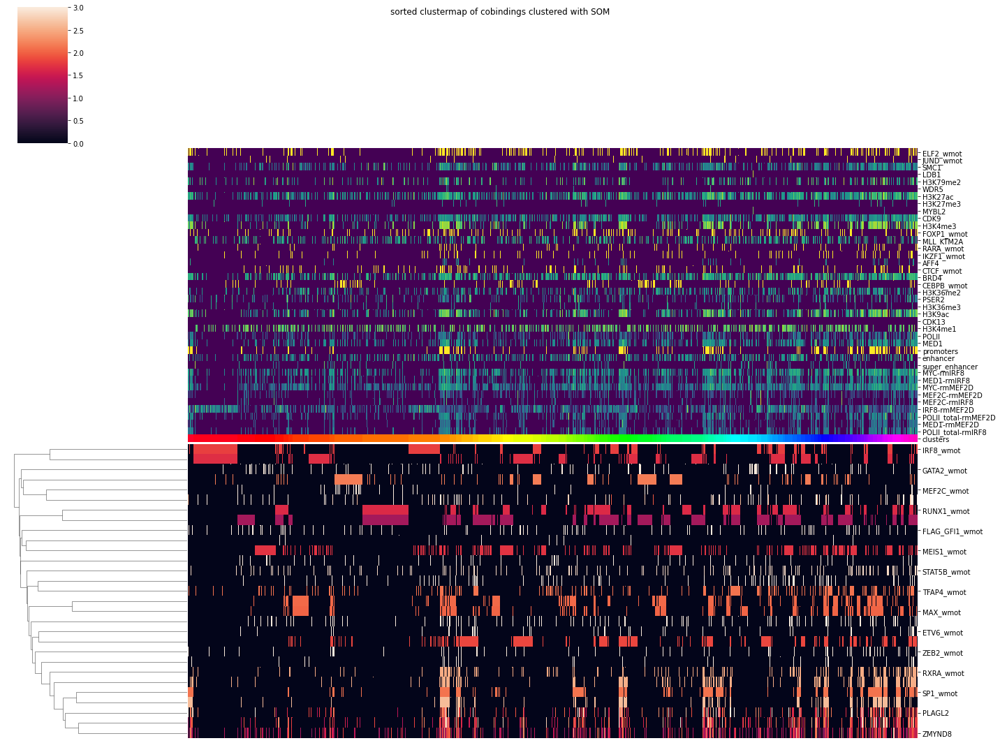

In [283]:
#sorted clustermap of cobindings clustered with SOM
fig = sns.clustermap(np.log2(1.01+merged[merged.columns[cols:annot]].iloc[sorting[rand]].T), vmin=0,vmax=3,figsize=(20,15),z_score=0, colors_ratio=0.01, col_cluster=False,col_colors=data, xticklabels=False)
fig.ax_col_dendrogram.set_visible(False)
fig.fig.suptitle("sorted clustermap of cobindings clustered with SOM")
fig.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/SOM_'+str(n_clust)+'_onbool__clustermap_cobinding.pdf')
plt.show()

In [287]:
#let's look at the enrichment over SOM clusters
groups = []
for i, val in enumerate(clusts):
    groups.extend([i]*len(val))
enr, pvals = await chip.enrichment(merged, groups = np.array(groups))

/home/jeremie/genepy/genepy/epigenetics/chipseq.py:421: RuntimeWarning: divide by zero encountered in log2
  enrichment[i, j] = np.log2(e)


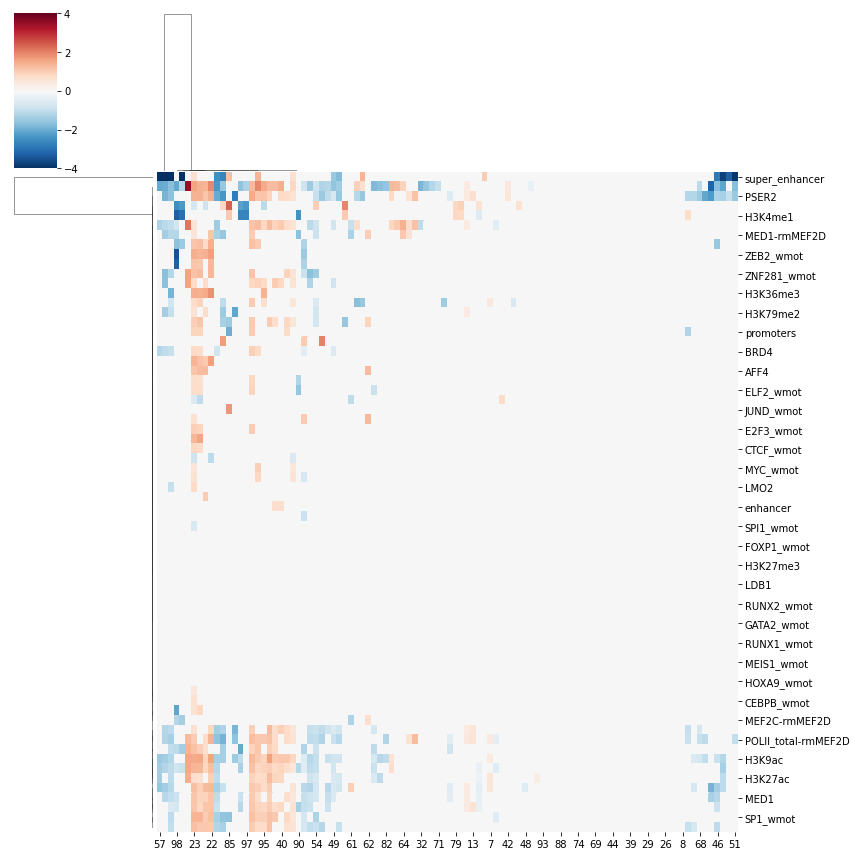

In [288]:
fig = sns.clustermap(enr, figsize=(12,12), vmax=4, vmin=-4, cmap='RdBu_r')
fig.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/kmeans_'+str(n_clust[n])+'_onbool_enrichment_on_SOMcluster_metasubset.pdf')
plt.show()

## Plot TSNE density map

In [289]:
rand = np.random.choice(merged.index,30000)

In [290]:
red_data = TSNE(2,600,verbose=10,n_iter=1500).fit_transform(scaled_data[rand])
np.save('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/red_data.npy',red_data)

/opt/conda/lib/python3.8/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass perplexity=600 as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "


[t-SNE] Computing 1801 nearest neighbors...
[t-SNE] Indexed 30000 samples in 0.002s...
[t-SNE] Computed neighbors for 30000 samples in 31.964s...
[t-SNE] Computed conditional probabilities for sample 1000 / 30000
[t-SNE] Computed conditional probabilities for sample 2000 / 30000
[t-SNE] Computed conditional probabilities for sample 3000 / 30000
[t-SNE] Computed conditional probabilities for sample 4000 / 30000
[t-SNE] Computed conditional probabilities for sample 5000 / 30000
[t-SNE] Computed conditional probabilities for sample 6000 / 30000
[t-SNE] Computed conditional probabilities for sample 7000 / 30000
[t-SNE] Computed conditional probabilities for sample 8000 / 30000
[t-SNE] Computed conditional probabilities for sample 9000 / 30000
[t-SNE] Computed conditional probabilities for sample 10000 / 30000
[t-SNE] Computed conditional probabilities for sample 11000 / 30000
[t-SNE] Computed conditional probabilities for sample 12000 / 30000
[t-SNE] Computed conditional probabilities for 

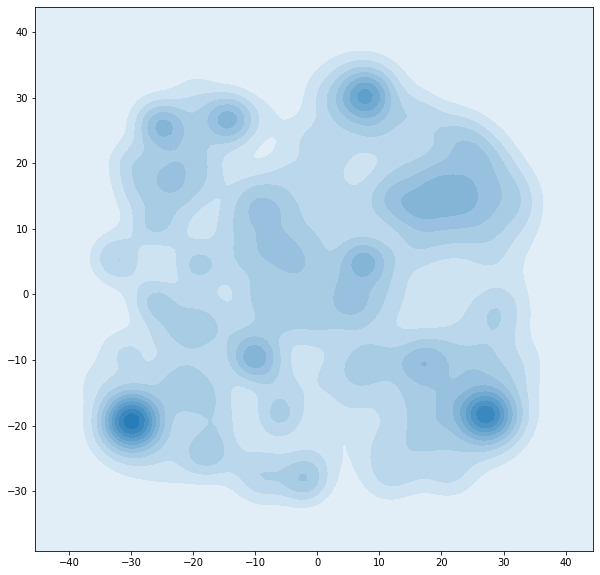

In [291]:
# Let's look at the data. the density map of the distribution of all pseudo enhancer over their tf binding profile
_, ax = plt.subplots(figsize=(10,10))
fig = sns.kdeplot(red_data[:,0], red_data[:,1], shade=True, ax=ax)
plt.savefig('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'/plots/density_TSNE_peaks.pdf')

A density plot where each point represent 2Dimensional hexagonal bin and the intensity represents the accumulaation of datapoints in these bins. The datapoints represent a random distribution of ~10% of all peaks of the cobinding matrix. They dimensionality reduced using TSNE over the scaled signal of bound TF on these peaks.

These islands and clusters represent categories / types of enhancers defined by their binding code.

In [292]:
# now let's look at it from anothe rploting method. we can see many many islands
plot.bigScatter(red_data,binsize=0.4,showpoint=False,precomputed=False, logscale=True, title='density plot of enhancers in TF cobinding space with TSNE', folder='../results/'+project+'/'+version+'_'+merging_version+'_'+window+"/plots/")

/home/jeremie/.local/lib/python3.8/site-packages/bokeh/io/saving.py:125: UserWarning: save() called but no resources were supplied and output_file(...) was never called, defaulting to resources.CDN
  warn("save() called but no resources were supplied and output_file(...) was never called, defaulting to resources.CDN")
/home/jeremie/.local/lib/python3.8/site-packages/bokeh/io/saving.py:138: UserWarning: save() called but no title was supplied and output_file(...) was never called, using default title 'Bokeh Plot'
  warn("save() called but no title was supplied and output_file(...) was never called, using default title 'Bokeh Plot'")


Figure(id='7982', ...)

In [ ]:
## TODO: color by feature

## TODO: color by dependencies/pathways/expression.. after ABC model,